In [1]:
# define the path of the data and project
data_path = 'D:/VScode/MRes/scienceweb.whoi.edu/itp/data/'

In [2]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_750=xr.open_dataset(f"{data_path}/ds_cleaned_750.nc")
# convert the profile data to string
ds_cleaned_750['profiler']=ds_cleaned_750['profiler'].astype(str)

In [3]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_250=xr.open_dataset(f"{data_path}/ds_cleaned_250.nc")
# convert the profile data to string
ds_cleaned_250['profiler']=ds_cleaned_250['profiler'].astype(str)
ds_cleaned_250=ds_cleaned_250.where(ds_cleaned_250['lat']>60,drop=True)

In [4]:
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [4]:
from pyxpcm.models import pcm
import numpy as np

def GMM(ds_train,ds_fit,K):  
    if np.max(ds_train.pressure) >=0:
        print('Warning, the pressure is not negative!!!')
    pstart=np.max(ds_train.pressure)
    pend=np.min(ds_train.pressure)
    z = np.arange(pstart,pend,-10.)

    pcm_features = {'temperature': z, 'salinity':z}
    m = pcm(K=K, features=pcm_features)
    
    features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}

    m.fit(ds_train,features=features_in_ds,dim='pressure')
    ds_fit=m.predict(ds_fit,features=features_in_ds,dim='pressure',inplace=True)
    return ds_fit,m



In [5]:
# function that plot three histograms, the first is the month distribution, the second and third are the longtidue and latitude distribution
import matplotlib.pyplot as plt
import seaborn as sns

def plot_distribution(ds):
    months = ds.date.dt.month.values

    sns.set_style("whitegrid")
    sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2.5})
    fig, ax = plt.subplots(1,3,figsize=(20,5),dpi=300)
    sns.histplot(months,ax=ax[0])
    sns.histplot(ds.lon,ax=ax[1])
    sns.histplot(ds.lat,ax=ax[2])
    # set the x and y label
    ax[0].set_xlabel('Month')
    ax[0].set_ylabel('Count')
    ax[1].set_xlabel('Longitude')
    ax[1].set_ylabel('Count')
    ax[2].set_xlabel('Latitude')
    ax[2].set_ylabel('Count')
    # set the title
    ax[0].set_title('Month distribution')
    ax[1].set_title('Longitude distribution')
    ax[2].set_title('Latitude distribution')
    plt.show()

#############################################################################################################
# function to plot month distribution
import matplotlib.pyplot as plt
import seaborn as sns

def plot_month_distribution(ds):
    months = ds.date.dt.month.values

    sns.set_style("whitegrid")
    sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2.5})
    fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=300)
    sns.histplot(months,ax=ax)
    # set the x and y label
    ax.set_xlabel('Month')
    ax.set_ylabel('Count')
    # set the title
    # ax.set_title('Month distribution')
    plt.show()


#############################################################################################################
# function that plot the the number of profiles in each bin
import pandas as pd
import numpy as np
import plotly.graph_objs as go

def plot_latlon_bins(ds, lat_step, lon_step,show_threshold=False,threshold_quantile=0.95):
    # Convert the 'lat' and 'lon' variables into a pandas dataframe
    df_latlon = ds[['lat', 'lon']].to_dataframe()

    lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
    lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

    latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

    g_len=[]
    for group_key in latlon_groups.groups:
        try:
            group = latlon_groups.get_group(group_key)
            #print(f"Group {group_key}: {len(group)} rows")
            g_len.append(len(group))
        except KeyError:
            # Handle the KeyError gracefully
            print(f"No data points for group {group_key}")


    g_len_sorted = sorted(g_len)
    transition_point = None
  
    g_len_diff=np.diff(g_len_sorted)

    threshold = np.quantile(g_len_diff,threshold_quantile)  # set a threshold for the difference between adjacent elements
    
    for i in range(1, len(g_len_sorted)):
        if g_len_sorted[i] - g_len_sorted[i-1] > threshold:
            transition_point = i-1
            break

    # Create a trace for the plot
    trace = go.Scatter(
        x = list(range(len(g_len_sorted))),
        y = g_len_sorted
    )

    # Add a red dot at the transition point
    if show_threshold:  
        if transition_point is not None:
            red_dot = go.Scatter(
                x=[transition_point],
                y=[g_len_sorted[transition_point]],
                mode='markers',
                marker=dict(color='red', size=10)
            )
            fig_data = [trace, red_dot]
        else:
            fig_data = [trace]
    else:
        fig_data = [trace]

    # Create the layout for the plot
    layout = go.Layout(
        xaxis=dict(title='Bin No.'),
        yaxis=dict(title='Number of profiles')
    )

    # Create the figure object and plot it
    fig = go.Figure(data=fig_data, layout=layout)
    fig.show()


#############################################################################################################
def cal_threshold(ds, lat_step, lon_step, quantile):
    # Convert the 'lat' and 'lon' variables into a pandas dataframe
    df_latlon = ds[['lat', 'lon']].to_dataframe()

    lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
    lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

    latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

    g_len=[]
    for group_key in latlon_groups.groups:
        try:
            group = latlon_groups.get_group(group_key)
            #print(f"Group {group_key}: {len(group)} rows")
            g_len.append(len(group))
        except KeyError:
            # Handle the KeyError gracefully
            print(f"No data points for group {group_key}")


    g_len_sorted = sorted(g_len)
    transition_point = None
  
    g_len_diff=np.diff(g_len_sorted)

    threshold = np.quantile(g_len_diff,quantile)  # set a threshold for the difference between adjacent elements
    
    for i in range(1, len(g_len_sorted)):
        if g_len_sorted[i] - g_len_sorted[i-1] > threshold:
            transition_point = i-1
            break

    return g_len_sorted[transition_point]



#############################################################################################################
# function that calculate ds length
def cal_length(ds,lat_step,lon_step, threshold):
    # Convert the 'lat' and 'lon' variables into a pandas dataframe
    df_latlon = ds[['lat', 'lon']].to_dataframe()

    lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
    lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

    latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

    # Create a list to store the groups with sample size larger than the threshold
    groups_drop_len_list = []

    # Loop through the groups
    for group_key in latlon_groups.groups:
        try:
            group = latlon_groups.get_group(group_key)
            if len(group) > threshold:
                groups_drop_len_list.append(len(group)-threshold)
                #print((len(group)-threshold))
        except KeyError:
            # Handle the KeyError gracefully
            # print(f"No data points for group {group_key}")
            continue

    ds_len=len(ds['nprof'])-sum(groups_drop_len_list)

    return ds_len

#############################################################################################################
# function that drop the profiles in the bins with sample size larger than the threshold
def drop_profiles(ds,lat_step,lon_step, threshold):
    # Convert the 'lat' and 'lon' variables into a pandas dataframe
    df_latlon = ds[['lat', 'lon']].to_dataframe()

    lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
    lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

    latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

    # Create a list to store the groups with sample size larger than the threshold
    latlon_groups_list = []

    # Loop through the groups
    for group_key in latlon_groups.groups:
        try:
            group = latlon_groups.get_group(group_key)
            if len(group) > threshold:
                # randomly sample the group of the dropped data
                group_drop = group.sample(n=len(group)-threshold, random_state=0)
                #print(f"Dropped data: Group {group_key}: {len(group_drop)} rows")
                # replace the group with the group_sample
                latlon_groups_list.append(group_drop)
        except KeyError:
            # Handle the KeyError gracefully
            print(f"No data points for group {group_key}")

    # create a new xarray that contains the data with sample size smaller than the threshold
    ds_spatially_sampled = ds.copy()

    # loop through the latlon_groups_list and create a list to store the nprof of the dropped data
    nprof_dropped = []

    for group in latlon_groups_list:
        # get the nprof of the dropped data
        temp_index = group.index.values
        #print(temp_index)
        nprof_dropped.append(temp_index.tolist())
    
    # reshape the list to 1D
    nprof_dropped = [item for sublist in nprof_dropped for item in sublist]
    # print the nprof_dropped
    #print(nprof_dropped)
    
    # drop the data 
    ds_spatially_sampled = ds_spatially_sampled.drop_sel(nprof=nprof_dropped)
    
    return ds_spatially_sampled


########################################################################################################################



# sample profiles by month
import numpy as np
import xarray as xr

def ramdon_sample_by_month(ds, ratio, random_seed=0):
    if ratio < 0 or ratio > 1:
        raise ValueError("Ratio must be between 0 and 1.")
        
    if 'date' not in ds:
        raise ValueError("Input dataset must have a 'date' variable.")
        
    if 'nprof' not in ds.dims:
        raise ValueError("Input dataset must have a 'nprof' dimension.")
    
    # group the dataset by month
    ds_monthly = ds.groupby('date.month')
    months_with_data = [month for month in ds_monthly.groups.keys() if len(ds_monthly[month]) > 0]
    
    if not months_with_data:
        raise ValueError("Input dataset does not contain any data.")
    
    # find the month with the smallest amount of data
    smallest_month_size = np.min([ds_monthly[month].nprof.size for month in months_with_data])
    selected_size_monthly=ds.nprof.size*ratio/12
    
    if smallest_month_size < selected_size_monthly:
        selected_size_monthly=smallest_month_size
        # ratio=smallest_month_size/ds.nprof.size*12
        print(f"Ratio is too large, selected_size_monthly is reset to the smallest_month_size: {smallest_month_size}")
    

    # print(f"Ratio is {ratio}, {int(selected_size_monthly)} profiles are selected from each month")
    # sample a fixed amount of data from each month
    ds_selected = xr.concat([ds_monthly[month].isel(nprof=np.random.default_rng(random_seed).choice(ds_monthly[month].nprof.size, int(selected_size_monthly), replace=False)) for month in months_with_data], dim='nprof')
    
    ds_selected['nprof'] = np.arange(ds_selected.sizes['nprof'])
    
    return ds_selected


########################################################################################################################
# function to plot the heatmap of the profiles distribution
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

def plot_heatmap(ds_cleaned, bin_max=None):
    # Define the map bounds and resolution
    lon_min, lon_max = -180, 180
    lat_min, lat_max = 70, 90
    latlon_step = 5
    resolution = 'l'  # l for low resolution, h for high resolution

    # Define bin edges for longitude, latitude, and pressure
    lon_bins = np.arange(lon_min, lon_max+1, latlon_step)
    lat_bins = np.arange(lat_min, lat_max+1, latlon_step)

    # Use the number of profiles in each bin as the height
    H, xedges, yedges = np.histogram2d(ds_cleaned.lon, ds_cleaned.lat, bins=[lon_bins, lat_bins])

    # Set up the figure and the Basemap instance
    fig = plt.figure(figsize=(8,8),dpi=300)
    m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution=resolution)

    m.drawparallels(np.arange(lat_min, lat_max+1, 5), labels=[], linewidth=0.1)
    m.drawmeridians(np.arange(lon_min, lon_max+1, 5), labels=[], linewidth=0.1)

    # Create the X and Y grids for the histogram
    X, Y = np.meshgrid(xedges[:-1], yedges[:-1])

    new_col = np.arange(lat_min, lat_max, latlon_step)
    Y = np.concatenate((Y, new_col[:, np.newaxis]), axis=1)

    new_col = lon_max*np.ones(len(lat_bins)-1)
    X = np.concatenate((X, new_col[:, np.newaxis]), axis=1)

    new_row = X[-1]
    X=np.vstack([X,new_row])

    new_row = lat_max*np.ones(np.shape(Y)[1])
    Y=np.vstack([Y,new_row])

    # Create the colored grid using pcolormesh
    cmap = plt.get_cmap('Wistia').copy()
    cmap.set_under(color='white', alpha=1.0)
    cmap.set_over(color='white', alpha=1.0)

    if bin_max is None:
        bin_max = H.max()
    

    m.pcolormesh(X, Y, H.T, cmap=cmap, vmin=1, vmax=bin_max, latlon=True)

    m.drawcoastlines()
    m.fillcontinents(color='grey',lake_color='lightblue')

    # Add a colorbar
    cbar = m.colorbar(location='bottom', pad="5%")
    cbar.set_label('Number of profiles')

    # Set the axis labels and title
    plt.xticks([])
    plt.yticks([])
    plt.title('Profiles distribution')

    # Show the plot
    plt.show()
    print(f'bin max={bin_max}')


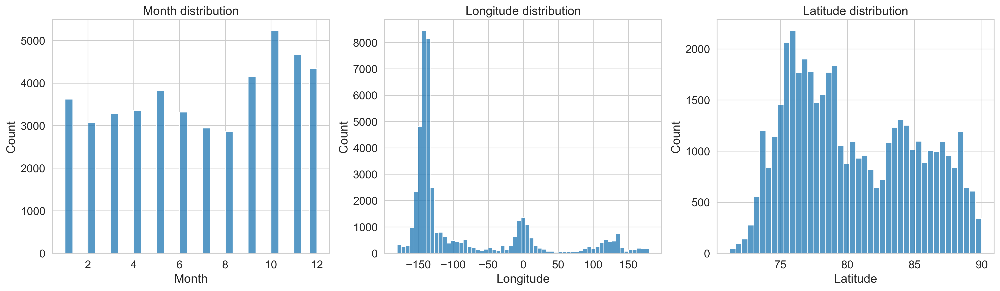

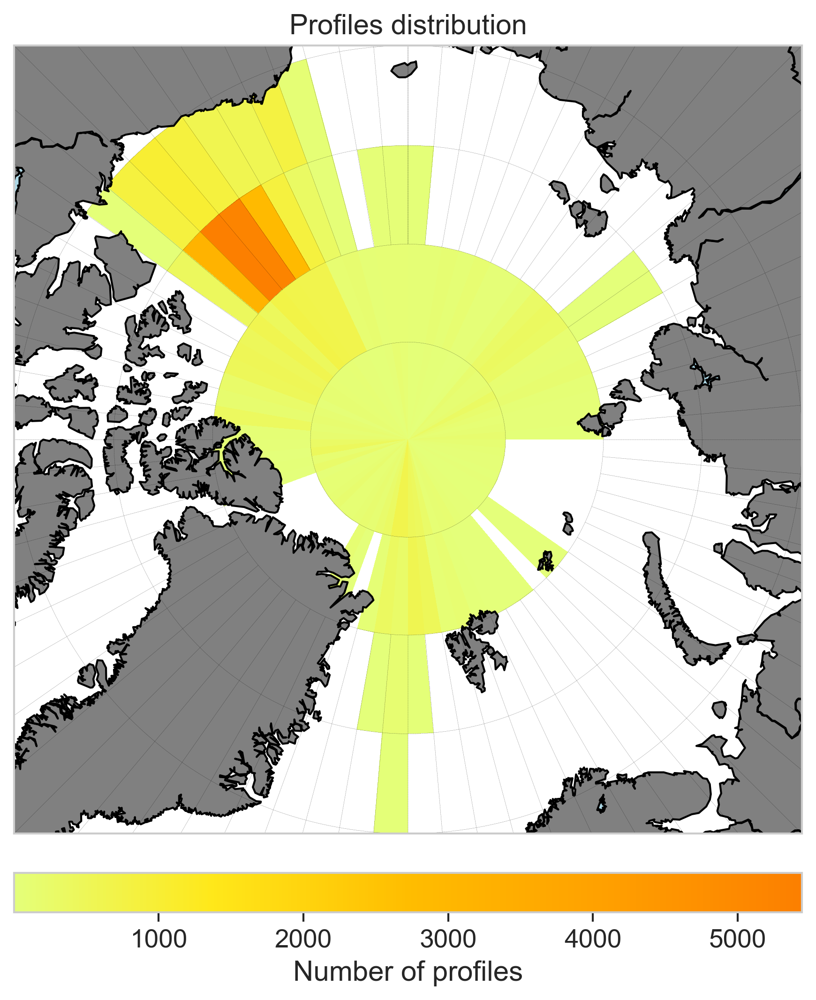

bin max=5444.0


In [9]:
plot_distribution(ds_cleaned_750)
plot_latlon_bins(ds_cleaned_750, 10, 20,show_threshold=True)
plot_heatmap(ds_cleaned_750)

In [6]:
# find the bining scheme that maximizes the number of profiles

def latlon_bining_ana(ds):
    lat_bins=[2,5,10]
    lon_bins=[10,20,30,40,50,60,70,80]
    ds_len=[]
    threshold=[]
    for i in lat_bins:
        for j in lon_bins:
            # T=cal_threshold(ds, i, j, quantile=0.95)
            T=int(cal_threshold(ds, i, j, quantile=0.95))
            ds_spatially_sampled = drop_profiles(ds, i, j, T)
            ds_monthly_sampled = ramdon_sample_by_month(ds_spatially_sampled, 1, random_seed=0)
            threshold.append(T)
            ds_len.append(ds_monthly_sampled.nprof.size)

    threshold=np.array(threshold)
    threshold=threshold.reshape(len(lat_bins),len(lon_bins))
    threshold=threshold.T
    threshold=pd.DataFrame(threshold,index=lon_bins,columns=lat_bins)

    # plot the ds_len changes with i and j as line plot
    ds_len=np.array(ds_len)
    ds_len=ds_len.reshape(len(lat_bins),len(lon_bins))
    ds_len=ds_len.T
    ds_len=pd.DataFrame(ds_len,index=lon_bins,columns=lat_bins)

    # plot the heatmap of the threshold and number of profiles
    fig, axs = plt.subplots(1, 2, figsize=(14, 6),dpi=300)
    sns.set_theme(style="whitegrid")

    # plot the heatmap of the threshold
    sns.heatmap(threshold, annot=True, linewidths=.5, cmap='YlGnBu', ax=axs[0])
    axs[0].set_title('Threshold')
    axs[0].set_xlabel('Latitude bin')
    axs[0].set_ylabel('Longitude bin')

    # plot the heatmap of the number of profiles
    sns.heatmap(ds_len, annot=True, linewidths=.5, cmap='YlGnBu', ax=axs[1])
    axs[1].set_title('Number of profiles')
    axs[1].set_xlabel('Latitude bin')
    axs[1].set_ylabel('Longitude bin')
    
    plt.show()



In [8]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_labels(ds, m,show_title=False):
    proj = ccrs.NorthPolarStereo()
    subplot_kw={'projection': proj}
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

    kmap = m.plot.cmap()
    sc = ax.scatter(ds['lon'], ds['lat'], s=3, c=ds['PCM_LABELS'], cmap=kmap, transform=ccrs.PlateCarree(), vmin=0, vmax=m.K)
    cl = m.plot.colorbar(ax=ax)

    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)

    if show_title:
        ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}, quantile4T={ds.quantile4T.values},nprof_of_train={ds.nprof_of_train.values}')

    plt.show()


def plot_quantile(ds_group):
    fig, axs = plt.subplots(1, 3, figsize=(12, 12),dpi=300)

    for i in range(3):
        qua5=ds_group[0]['temperature_Q'][i][0].values
        qua50=ds_group[0]['temperature_Q'][i][1].values
        qua95=ds_group[0]['temperature_Q'][i][2].values
        ax=axs[i]
        ax.plot(qua5,ds_group[0]['pressure'].values,c='b',label=0.05)
        ax.plot(qua50,ds_group[0]['pressure'].values,c='r',label=0.50)
        ax.plot(qua95,ds_group[0]['pressure'].values,c='g',label=0.95)
        ax.grid(True)
        ax.legend()
        ax.set_title(f'Class {i+1}')
        ax.set_ylabel('Pressure')
        ax.set_xlabel('Temperature')

    plt.subplots_adjust(wspace=0.3, hspace=0.25)
    plt.show()

def plot_mean_profile(ds_fit,m):
    # Calculate the quantile and plot it
    for vname in ['temperature', 'salinity']:
        ds_fit = ds_fit.pyxpcm.quantile(m, q=[0.05, 0.5, 0.95], of=vname, outname=vname + '_Q', keep_attrs=True, inplace=True)    

    ds_group = ds_fit.groupby('PCM_LABELS')
    tb.plot_quantile(ds_group)

In [13]:
# make a pipeline to prepare the training data
def prepare_training_data(lat_step,lon_step,quantile4T,ds_cleaned,ratio_monthly_sampled=1):
    threshold=int(cal_threshold(ds_cleaned, lat_step, lon_step, quantile=quantile4T))
    ds_cleaned_spatially_sampled = drop_profiles(ds_cleaned, lat_step, lon_step, threshold)
    ds_cleaned_monthly_sampled = ramdon_sample_by_month(ds_cleaned_spatially_sampled, ratio_monthly_sampled, random_seed=0)
    ds_cleaned_monthly_sampled['lat_step']=lat_step
    ds_cleaned_monthly_sampled['lon_step']=lon_step
    ds_cleaned_monthly_sampled['quantile4T']=quantile4T
    print(f'threshold={threshold}, training dataset size={len(ds_cleaned_monthly_sampled.nprof)}')
    return ds_cleaned_monthly_sampled


Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1338
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1555
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1605
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2219
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points for group (nan, Interval(86, 88, closed='right'))
No data points for group (nan, Interval(88, 90, closed='right'))
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points

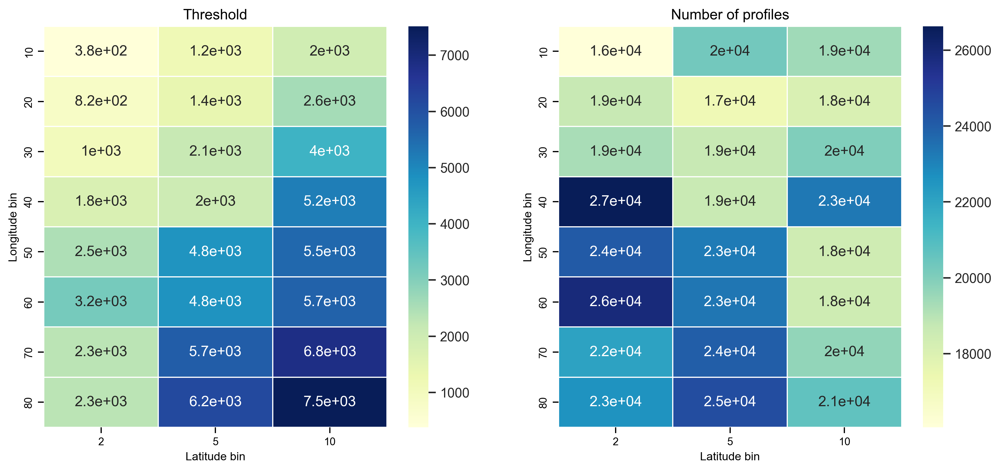

In [18]:
latlon_bining_ana(ds_cleaned_750)

In [71]:
ds_train_750_latlonT_2_60_95=prepare_training_data(2,60,0.95,ds_cleaned_750)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2148
threshold=3170, training dataset size=25776


In [32]:
'''Define the function that compare the spatial distribution of sampled data with the original data in a same plot'''
def plot_latlon_compare(ds,ds_sampled):
    sns.set_style("whitegrid")
    sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2.5})
    fig, ax = plt.subplots(1,1,figsize=(10,10),dpi=300)
    sns.scatterplot(data=ds,x='lon',y='lat',s=5,label='Original data')
    sns.scatterplot(data=ds_sampled,x='lon',y='lat',s=5,label='Sampled data')
    # set the x and y label
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # set the title
    ax.set_title('Profiles distribution')
    plt.show()

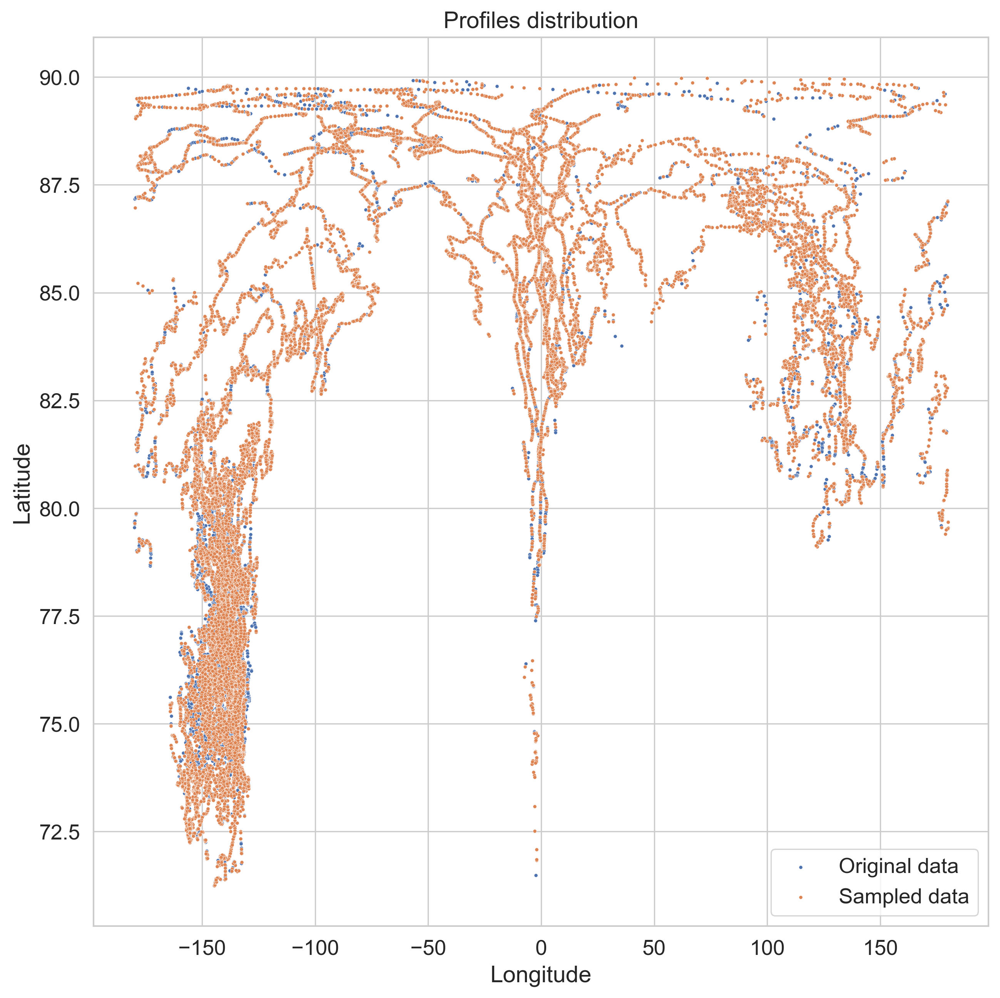

In [59]:
plot_latlon_compare(ds_cleaned_750,ds_train_750_latlonT_2_60_95)

In [51]:
# measure the spatial coverage of the sampled data compared with the original data
import numpy as np

def compare_spatial_coverage(ds,ds_sampled):
    # get the unique lat-lon pints of the original data
    ds_unique = np.unique((ds.lat.values, ds.lon.values), axis=1)
    # print(ds_unique.shape)
    # get the unique lat-lon pints of the sampled data
    ds_sampled_unique=np.unique((ds_sampled.lat.values, ds_sampled.lon.values), axis=1)
    # print(ds_sampled_unique.shape)
    coverage=ds_sampled_unique.shape[1]/ds_unique.shape[1]
    return coverage


In [63]:
compare_spatial_coverage(ds_cleaned_750,ds_train_750_latlonT_2_60_95)

0.5854967660797701

In [55]:
def cal_spatial_density(ds):
    # Convert the 'lat' and 'lon' variables into a pandas dataframe
    df_latlon = ds[['lat', 'lon']].to_dataframe()
    lat_step=1
    lon_step=2

    lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
    lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

    latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

    g_len=[]
    for group_key in latlon_groups.groups:
        try:
            group = latlon_groups.get_group(group_key)
            #print(f"Group {group_key}: {len(group)} rows")
            g_len.append(len(group))
        except KeyError:
            # Handle the KeyError gracefully
            print(f"No data points for group {group_key}")

    var=np.var(g_len)

    return var

In [65]:
cal_spatial_density(ds_cleaned_750)

5942.685068359375

In [95]:
cal_spatial_density(ds_cleaned_250)

15532.141843889605

In [76]:
cal_spatial_density(ds_train_750_latlonT_2_60_95)

1145.5479941188823

In [78]:
def coverage_ana(ds):
    lat_bins=[2,5,10]
    lon_bins=[10,20,30,40,50,60,70,80]
    coverage_list=[]
    var_list=[]
    for i in lat_bins:
        for j in lon_bins:
            T=int(cal_threshold(ds, i, j, quantile=0.95))
            ds_spatially_sampled = drop_profiles(ds, i, j, T)
            ds_monthly_sampled = ramdon_sample_by_month(ds_spatially_sampled, 1, random_seed=0)
            coverage=compare_spatial_coverage(ds,ds_monthly_sampled)
            coverage_list.append(coverage)
            var=cal_spatial_density(ds_monthly_sampled)
            var_list.append(var)
    
    # plot the heatmap of the coverage
    coverage_list=np.array(coverage_list)
    coverage_list=coverage_list.reshape(len(lat_bins),len(lon_bins))
    coverage_list=coverage_list.T
    coverage_list=pd.DataFrame(coverage_list,index=lon_bins,columns=lat_bins)

    # plot the heatmap of the var
    var_list=np.array(var_list)
    var_list=var_list.reshape(len(lat_bins),len(lon_bins))
    var_list=var_list.T
    var_list=pd.DataFrame(var_list,index=lon_bins,columns=lat_bins)

    fig, axs = plt.subplots(1, 2, figsize=(14, 6),dpi=300)
    sns.set_theme(style="whitegrid")

    # plot the heatmap of the coverage
    sns.heatmap(coverage_list, annot=True, linewidths=.5, cmap='YlGnBu', ax=axs[0])
    axs[0].set_title('The spatial coverage of sampled data (%)')
    axs[0].set_xlabel('Latitude bin')
    axs[0].set_ylabel('Longitude bin')

    # plot the heatmap of the var
    sns.heatmap(var_list, annot=True, linewidths=.5, cmap='Wistia', ax=axs[1])
    axs[1].set_title('Variance of spatial density (lower is better)')
    axs[1].set_xlabel('Latitude bin')
    axs[1].set_ylabel('Longitude bin')

    plt.show()
    

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1337
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1567
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1583
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2233
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points for group (nan, Interval(86, 88, closed='right'))
No data points for group (nan, Interval(88, 90, closed='right'))
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points

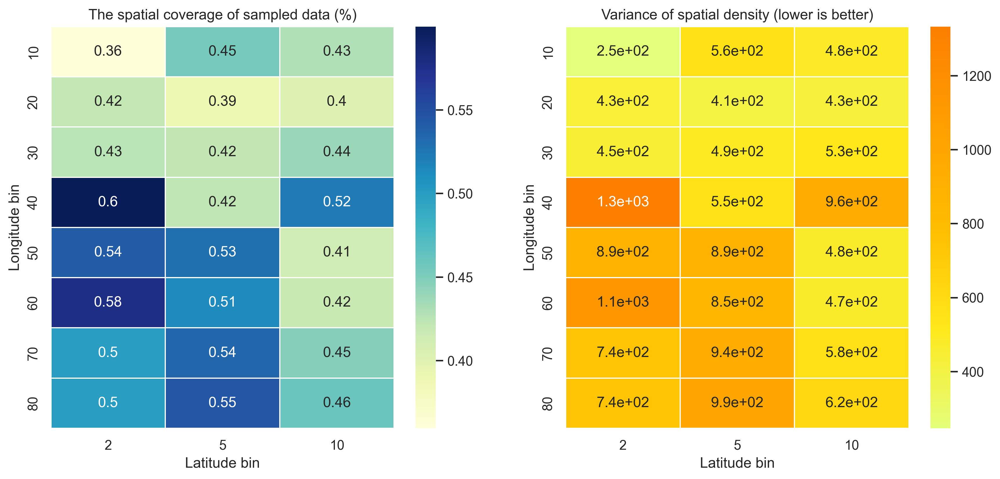

In [79]:
coverage_ana(ds_cleaned_750)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2616
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2659
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2420
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2746
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points for group (nan, Interval(86, 88, closed='right'))
No data points for group (nan, Interval(88, 90, closed='right'))
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points

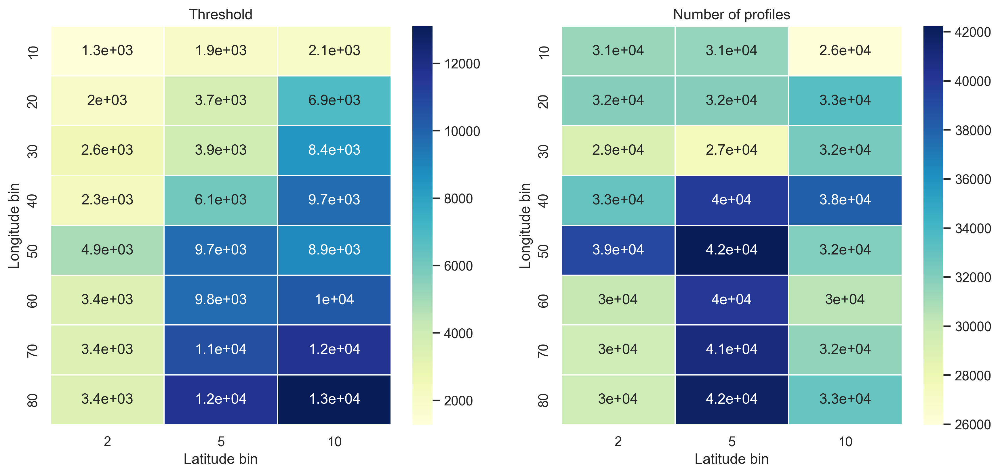

In [93]:
latlon_bining_ana(ds_cleaned_250)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2616
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2659
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2420
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2746
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points for group (nan, Interval(86, 88, closed='right'))
No data points for group (nan, Interval(88, 90, closed='right'))
No data points for group (nan, Interval(78, 80, closed='right'))
No data points for group (nan, Interval(80, 82, closed='right'))
No data points for group (nan, Interval(82, 84, closed='right'))
No data points for group (nan, Interval(84, 86, closed='right'))
No data points

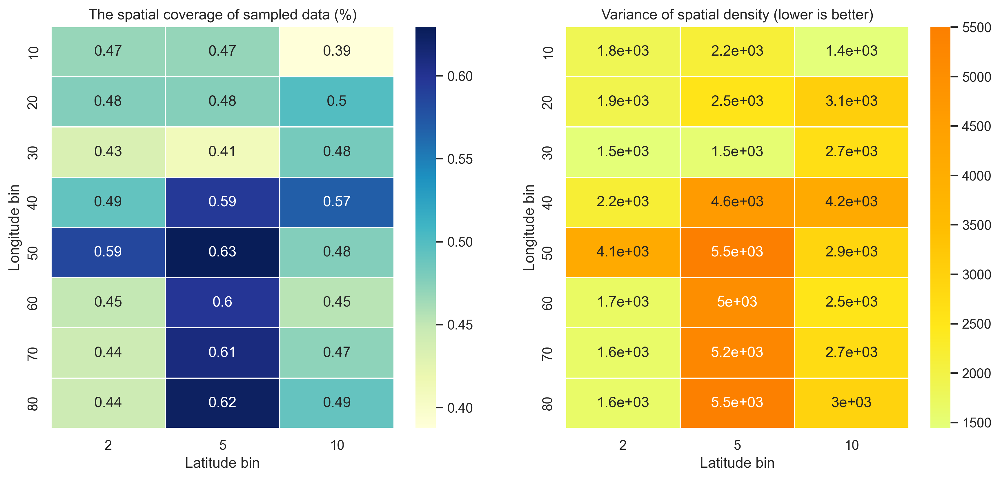

In [94]:
coverage_ana(ds_cleaned_250)

In [14]:
ds_train_750_latlonT_5_30_95=prepare_training_data(5,30,0.95,ds_cleaned_750,0.5)
ds_train_750_latlonT_5_50_95=prepare_training_data(5,50,0.95,ds_cleaned_750,0.5)

threshold=2135, training dataset size=13548
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
threshold=4770, training dataset size=15708


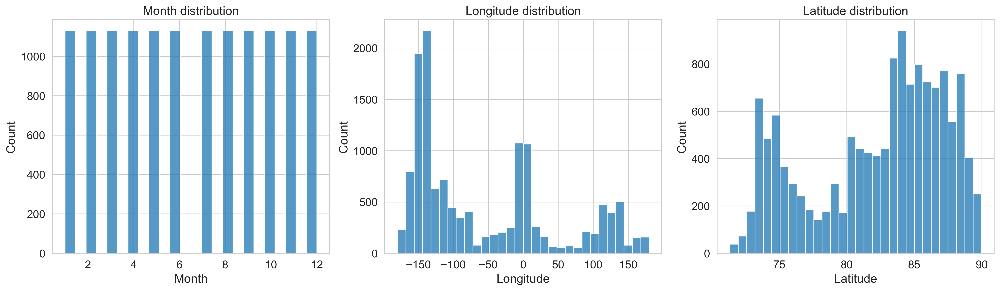

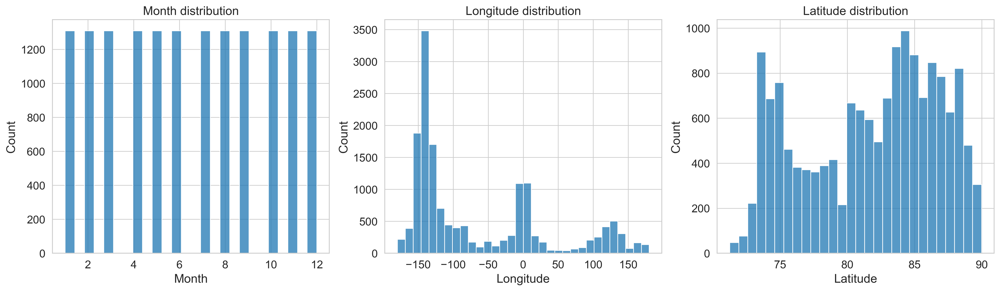

In [15]:
plot_distribution(ds_train_750_latlonT_5_30_95)
plot_distribution(ds_train_750_latlonT_5_50_95)

In [9]:
plot_latlon_bins(ds_cleaned_750, 5, 60,show_threshold=True)

In [27]:
lat_step=5
lon_step=60
quantile=0.95
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=quantile))
ds_cleaned_750_spatially_sampled = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
ds_cleaned_750_spatially_sampled

<xarray.Dataset>
Dimensions:           (nprof: 29471, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0003' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] 2017-09-21T00:02:02.688000 ... 2...
    lon               (nprof) float64 -148.8 -145.6 -145.1 ... -97.41 -95.51
    lat               (nprof) float64 80.1 80.28 80.31 ... 82.69 82.65 82.75
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

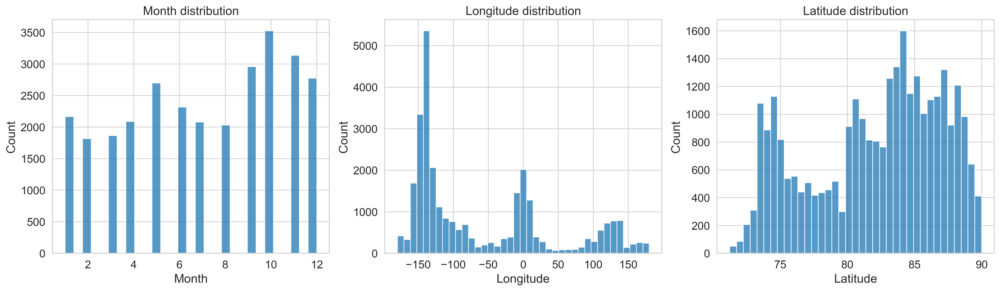

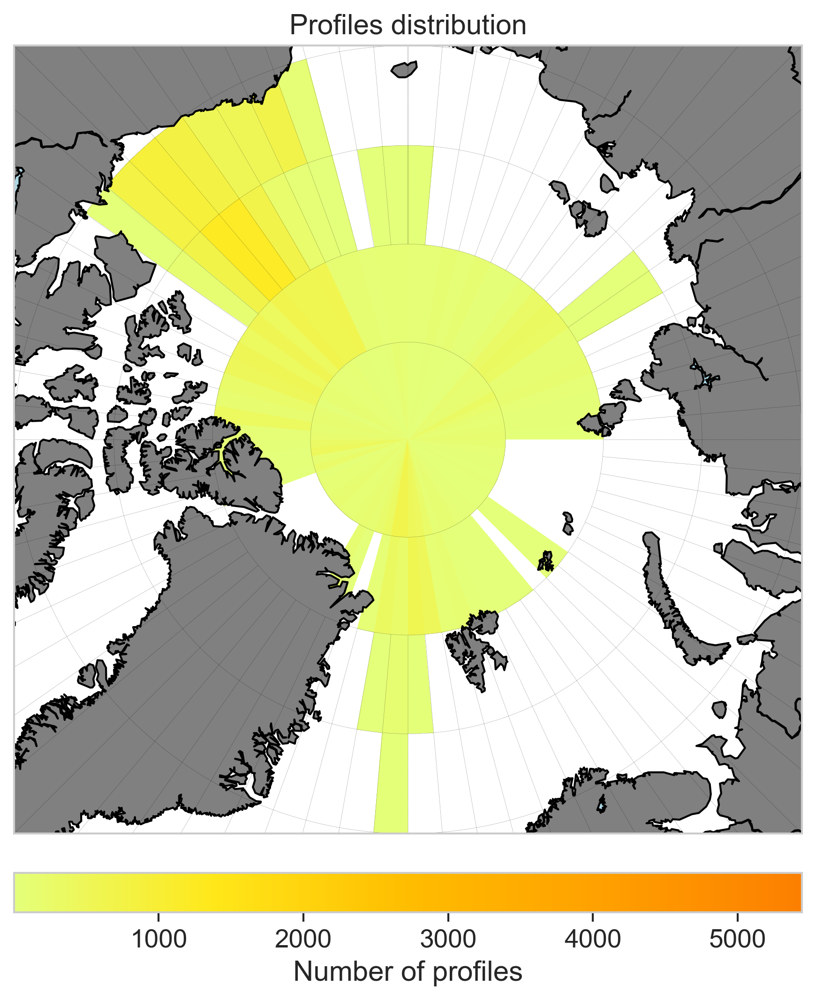

bin max=5444


In [28]:
plot_distribution(ds_cleaned_750_spatially_sampled)
plot_latlon_bins(ds_cleaned_750_spatially_sampled, lat_step, lon_step)
plot_heatmap(ds_cleaned_750_spatially_sampled,bin_max=5444)

In [28]:
# sample the data by month
ds_cleaned_750_monthly_sampled = ramdon_sample_by_month(ds_cleaned_750_spatially_sampled, 1, random_seed=0)
# add a variable to indicate lat_step, lon_step, quantile
ds_cleaned_750_monthly_sampled['lat_step']=lat_step
ds_cleaned_750_monthly_sampled['lon_step']=lon_step
ds_cleaned_750_monthly_sampled['quantile']=quantile

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1778


In [29]:
ds_cleaned_750_monthly_sampled

<xarray.Dataset>
Dimensions:           (nprof: 21336, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp5grd0421' ... 'itp13grd0310'
    date              (nprof) datetime64[ns] 2007-01-27T00:00:01.728000 ... 2...
    lon               (nprof) float64 -144.0 -137.8 125.1 ... -143.7 -136.4
    lat               (nprof) float64 75.89 75.9 86.75 ... 87.32 71.33 78.55
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 ... 21331 21332 21333 21334 21335
Data variables:
    temperature       (nprof, pressure) float64 -1.46 -1.46 ... 0.238 0.2266
    salinity          (nprof, pressure) float64 26.72 26.73 ... 34.87 34.87
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan ... 299.5 300.1
    lat_step          int32 5
    lon_step          int32 60
    quantile          float64 0.95

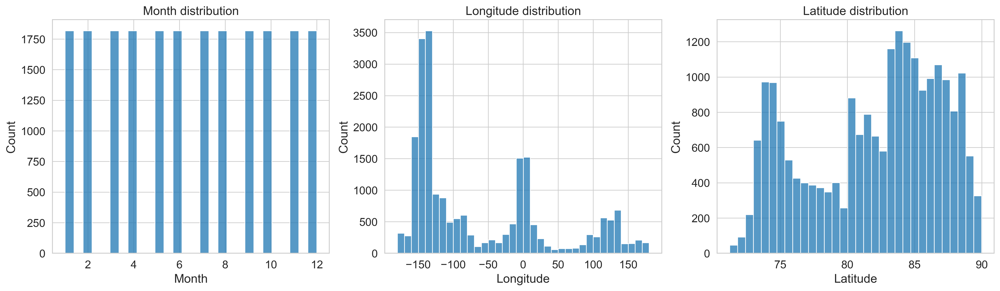

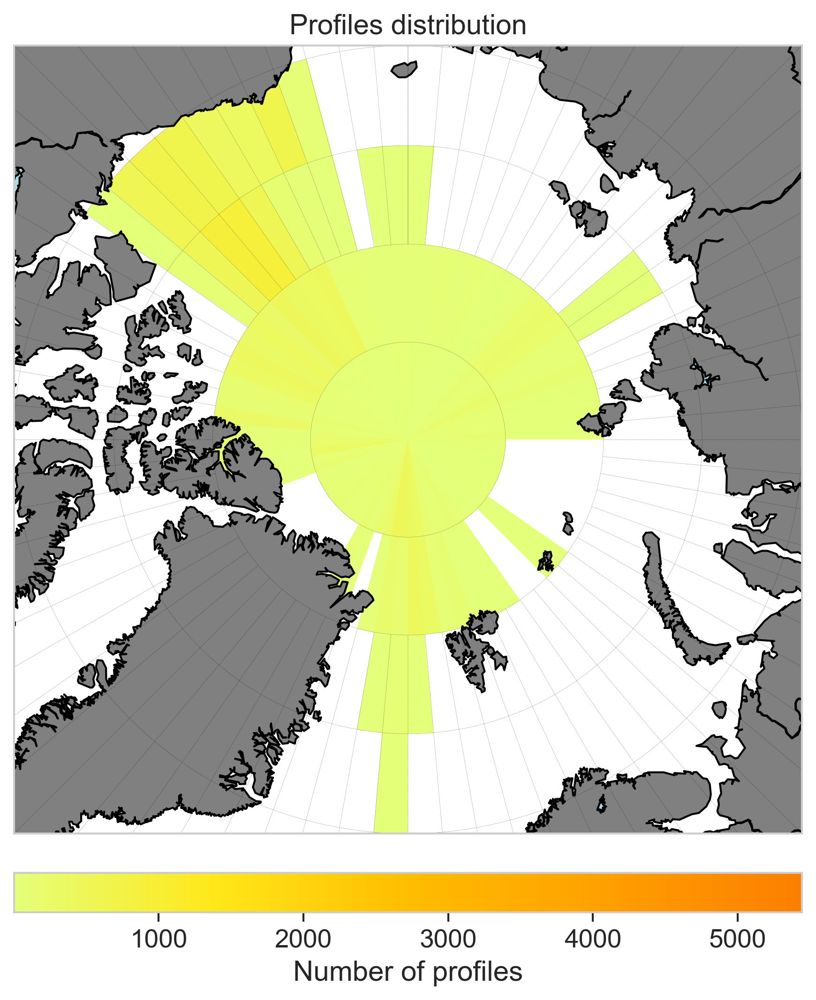

bin max=5444


In [29]:
plot_distribution(ds_cleaned_750_monthly_sampled)
#plot_month_distribution(ds_cleaned_750_monthly_sampled)
plot_latlon_bins(ds_cleaned_750_monthly_sampled, 10, 20)
plot_heatmap(ds_cleaned_750_monthly_sampled,bin_max=5444)

In [80]:
ds_train_750_latlonT_5_60_95=prepare_training_data(5,60,0.95,ds_cleaned_750)
ds_train_750_latlonT_5_60_90=prepare_training_data(5,60,0.90,ds_cleaned_750)
ds_train_750_latlonT_5_60_85=prepare_training_data(5,60,0.85,ds_cleaned_750)
ds_train_750_latlonT_2_60_95=prepare_training_data(2,60,0.95,ds_cleaned_750)
ds_train_750_latlonT_5_70_95=prepare_training_data(5,70,0.95,ds_cleaned_750)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1913
threshold=4807, training dataset size=22956
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1455
threshold=2831, training dataset size=17460
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1231
threshold=2030, training dataset size=14772
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2148
threshold=3170, training dataset size=25776
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1993
threshold=5746

In [131]:
plot_latlon_bins(ds_cleaned_750, 5, 60,show_threshold=True)
plot_latlon_bins(ds_cleaned_750, 5, 60,show_threshold=True,threshold_quantile=0.80)

In [135]:
print(ds_train_750_latlonT_5_60_95.nprof.size)
print(ds_train_750_latlonT_5_60_90.nprof.size)
print(ds_train_750_latlonT_5_60_85.nprof.size)
print(ds_train_750_latlonT_2_60_95.nprof.size)
print(ds_train_750_latlonT_5_70_95.nprof.size)


23508
17304
14688
25932
24252


In [81]:
# fit the model
ds_fit_750_latlonT_5_60_95,m_latlonT_5_60_95=GMM(ds_train_750_latlonT_5_60_95,ds_cleaned_750.copy(),3)
ds_fit_750_latlonT_5_60_90,m_latlonT_5_60_90=GMM(ds_train_750_latlonT_5_60_90,ds_cleaned_750.copy(),3)
ds_fit_750_latlonT_5_60_85,m_latlonT_5_60_85=GMM(ds_train_750_latlonT_5_60_85,ds_cleaned_750.copy(),3)
ds_fit_750_latlonT_2_60_95,m_latlonT_2_60_95=GMM(ds_train_750_latlonT_2_60_95,ds_cleaned_750.copy(),3)
ds_fit_750_latlonT_5_70_95,m_latlonT_5_70_95=GMM(ds_train_750_latlonT_5_70_95,ds_cleaned_750.copy(),3)


In [82]:
def add_info(ds_train,ds_fit):
    ds_fit['lat_step']=ds_train['lat_step']
    ds_fit['lon_step']=ds_train['lon_step']
    ds_fit['quantile4T']=ds_train['quantile4T']
    ds_fit['nprof_of_train']=ds_train.nprof.size
    return ds_fit

In [83]:
ds_fit_750_latlonT_5_60_95=add_info(ds_train_750_latlonT_5_60_95,ds_fit_750_latlonT_5_60_95)
ds_fit_750_latlonT_5_60_90=add_info(ds_train_750_latlonT_5_60_90,ds_fit_750_latlonT_5_60_90)
ds_fit_750_latlonT_5_60_85=add_info(ds_train_750_latlonT_5_60_85,ds_fit_750_latlonT_5_60_85)
ds_fit_750_latlonT_2_60_95=add_info(ds_train_750_latlonT_2_60_95,ds_fit_750_latlonT_2_60_95)
ds_fit_750_latlonT_5_70_95=add_info(ds_train_750_latlonT_5_70_95,ds_fit_750_latlonT_5_70_95)

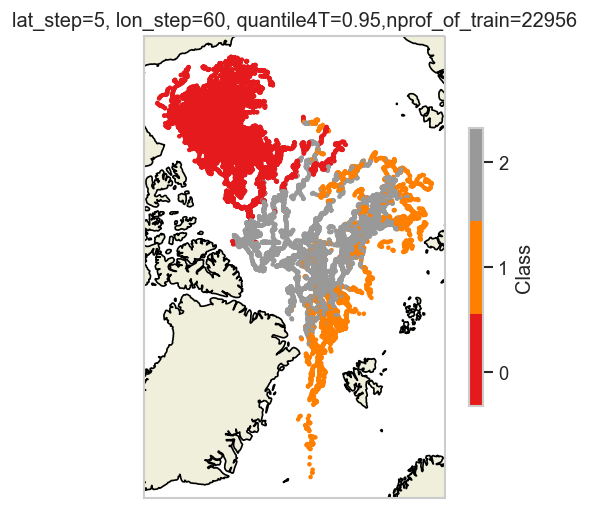

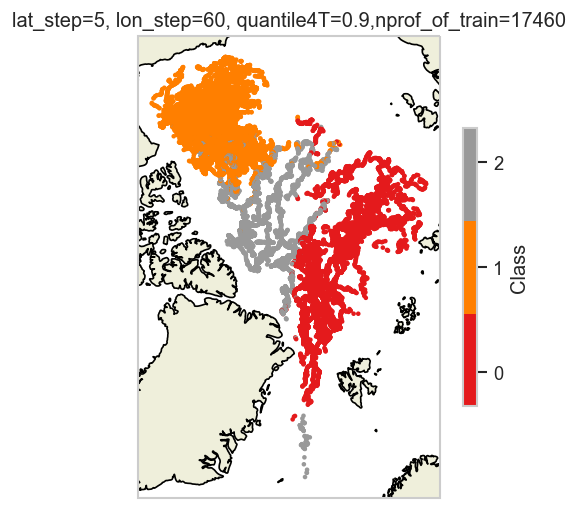

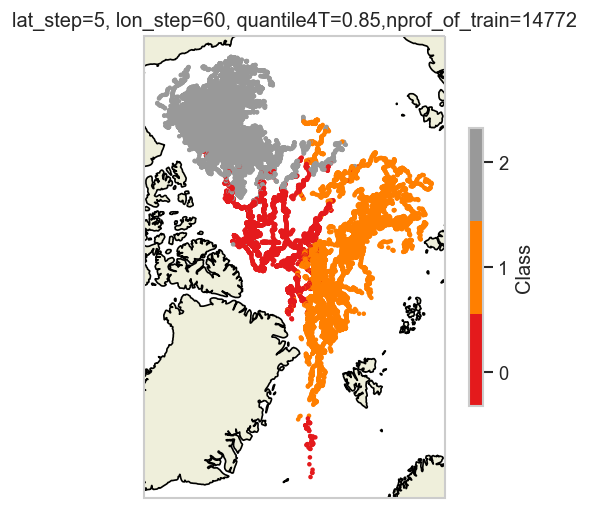

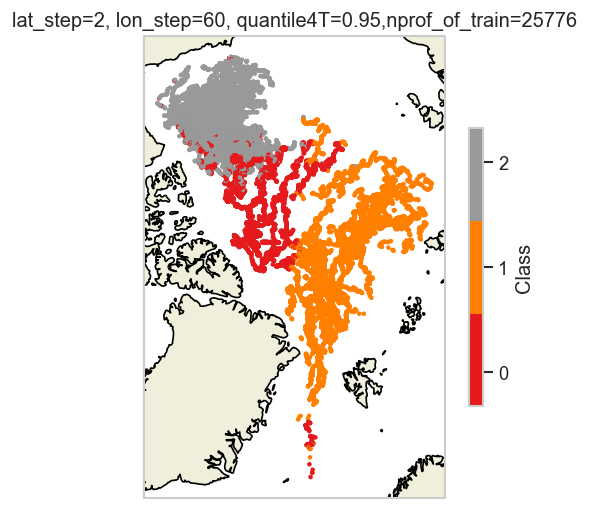

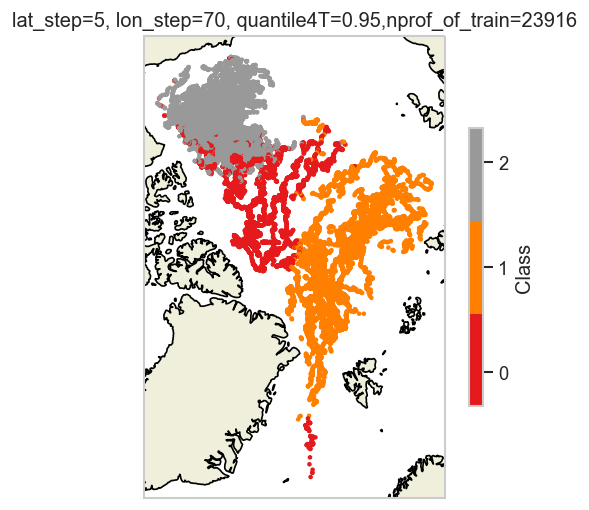

In [84]:
plot_labels(ds_fit_750_latlonT_5_60_95,m_latlonT_5_60_95,show_title=True)
plot_labels(ds_fit_750_latlonT_5_60_90,m_latlonT_5_60_90,show_title=True)
plot_labels(ds_fit_750_latlonT_5_60_85,m_latlonT_5_60_85,show_title=True)
plot_labels(ds_fit_750_latlonT_2_60_95,m_latlonT_2_60_95,show_title=True)
plot_labels(ds_fit_750_latlonT_5_70_95,m_latlonT_5_70_95,show_title=True)

In [87]:
features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
m_latlonT_5_60_95.predict_proba(ds_cleaned_750, features=features_in_ds, dim='pressure',inplace=True)
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148, pcm_class: 3)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] 2017-09-20T00:02:04.416000 ... 2...
    lon               (nprof) float64 -149.2 -148.8 -148.0 ... -97.41 -95.51
    lat               (nprof) float64 80.04 80.1 80.18 ... 82.69 82.65 82.75
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int64 0 1 2 3 4 ... 44687 44688 44689 44690 44691
Dimensions without coordinates: pcm_class
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... 0.2263 0.2201
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 ...
    PCM_POST          (pcm_class, nprof) float64 1.0 1.0 ... 3.565e-31 3.754e-52

In [26]:
ds_cleaned_750.info

<bound method Dataset.info of <xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148, pcm_class: 3)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] 2017-09-20T00:02:04.416000 ... 2...
    lon               (nprof) float64 -149.2 -148.8 -148.0 ... -97.41 -95.51
    lat               (nprof) float64 80.04 80.1 80.18 ... 82.69 82.65 82.75
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int64 0 1 2 3 4 ... 44687 44688 44689 44690 44691
Dimensions without coordinates: pcm_class
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... 0.2263 0.2201
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 ...
    PCM_POST          (pcm_class, nprof) float64 4.068e-247 2.93e-228 ... 1.0>

In [169]:
pcm_post=ds_cleaned_750.PCM_POST.values     
# np.max(pcm_post,axis=0)
pcm_post[:,0]

array([1.00000000e+000, 0.00000000e+000, 2.07180017e-183])

In [171]:
pcm_post.shape[0]

3

In [180]:
pcm_post=ds_cleaned_750.PCM_POST.values  

In [181]:
np.max(pcm_post,axis=0)

array([1., 1., 1., ..., 1., 1., 1.])

In [182]:
pcm_post[:,1]

array([1.00000000e+000, 0.00000000e+000, 2.52860496e-102])

In [90]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

def plot_pcm_post(ds,interested_range=[0.4,0.6]):
    # Set up the map projection
    proj = ccrs.NorthPolarStereo()
    subplot_kw={'projection': proj}
    nrows=ds.PCM_POST.shape[0]
    fig, axs = plt.subplots(nrows, ncols=1, figsize=(8*nrows,10), dpi=300, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

    # Plot the PCM_POST using scatter plot, with color representing the PCM_LABELS

    # reshape ds['PCM_POST']
    # pcm_post=ds.PCM_POST.values   
    for i in range(ds.PCM_POST.values.shape[0]):
        ax=axs[i]
        pcm_post=ds.PCM_POST.values[i,:]
        # print(pcm_post)
        # Create a scatter plot
        sc = ax.scatter(ds['lon'], ds['lat'], s=3, c=np.array([pcm_post]), cmap='viridis', transform=ccrs.PlateCarree(), vmin=np.min(pcm_post), vmax=np.max(pcm_post))
        # get the pcm_post value between interested_range
        lower=interested_range[0]
        upper=interested_range[1]
        pcm_post_interested=pcm_post[(pcm_post>lower) & (pcm_post<upper)]
        # get the lon lat that correspond to the pcm_post_interested
        lon_interested=ds['lon'].values[(pcm_post>lower) & (pcm_post<upper)]
        lat_interested=ds['lat'].values[(pcm_post>lower) & (pcm_post<upper)]
        # plot pcm_post_interested using scatter plot
        ax.scatter(lon_interested, lat_interested, s=3, c=np.array([pcm_post_interested]), cmap='viridis', transform=ccrs.PlateCarree(), vmin=np.min(pcm_post), vmax=np.max(pcm_post))

        ax.add_feature(cfeature.LAND)
        ax.add_feature(cfeature.COASTLINE)

        # Add a color bar
        cbar = plt.colorbar(sc, ax=ax, shrink=0.7)
        cbar.ax.set_ylabel('likelihood')

        # Set the title
        ax.set_title(f'Likelihood of class {i}')

    # Show the plot
    plt.show()

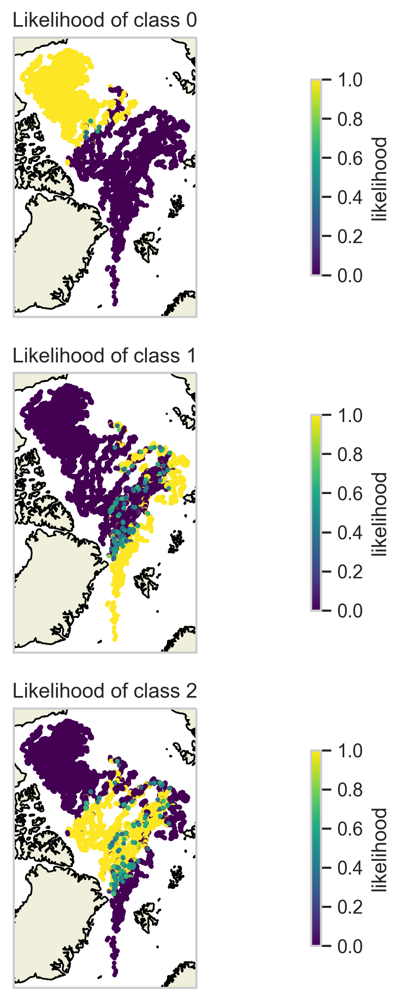

In [92]:
plot_pcm_post(ds_cleaned_750,interested_range=[0.3,0.7])

In [199]:
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature
# import matplotlib.pyplot as plt
# import numpy as np
# import xarray as xr

# def plot_pcm_post(ds):
#     # Set up the map projection
#     proj = ccrs.NorthPolarStereo()
#     subplot_kw={'projection': proj}
#     fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

#     # Plot the PCM_POST using scatter plot, with color representing the PCM_LABELS

#     # reshape ds['PCM_POST']
#     pcm_post=ds.PCM_POST.values   
#     pcm_post=pcm_post[:,2]
#     # Create a scatter plot
#     sc = ax.scatter(ds['lon'], ds['lat'], s=3, c=np.array([pcm_post]), cmap='viridis', transform=ccrs.PlateCarree(), vmin=np.min(pcm_post), vmax=np.max(pcm_post))

#     ax.add_feature(cfeature.LAND)
#     ax.add_feature(cfeature.COASTLINE)

#     # Add a color bar
#     cbar = plt.colorbar(sc, ax=ax, shrink=0.7)
#     cbar.ax.set_ylabel('Maximum PCM_POST')

#     # Set the title
#     ax.set_title('PCM_POST')

#     # Show the plot
#     plt.show()


























# # import cartopy.crs as ccrs
# # import cartopy.feature as cfeature
# # import matplotlib.pyplot as plt
# # import numpy as np
# # import xarray as xr

# # def plot_pcm_post(ds):
# #     # Set up the map projection
# #     pcm_post=ds.PCM_POST.values   
# #     proj = ccrs.NorthPolarStereo()
# #     subplot_kw={'projection': proj}
# #     nrows=pcm_post.shape[0]
# #     fig, axs = plt.subplots(nrows, ncols=1, figsize=(nrows*5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

# #     # Plot the PCM_POST using scatter plot, with color representing the PCM_LABELS

# #     # reshape ds['PCM_POST']
# #     for i in range(nrows):
# #         ax=axs[i]

# #         pcm_post_pre_class=pcm_post[:,i]
# #         # Create a scatter plot
# #         sc = ax.scatter(ds['lon'], ds['lat'], s=3, c=pcm_post_pre_class, cmap='viridis', transform=ccrs.PlateCarree(), vmin=0, vmax=np.max(pcm_post_pre_class))

# #         ax.add_feature(cfeature.LAND)
# #         ax.add_feature(cfeature.COASTLINE)

# #         # Add a color bar
# #         cbar = plt.colorbar(sc, ax=ax, shrink=0.7)
# #         cbar.ax.set_ylabel('Maximum PCM_POST')

# #         # Set the title
# #         ax.set_title(f'Class {i}')

# #     # Show the plot
# #     plt.show()














# # import cartopy.crs as ccrs
# # import matplotlib.pyplot as plt
# # import xarray as xr

# # def plot_pcm_post(ds):

# #     proj = ccrs.NorthPolarStereo()
# #     subplot_kw={'projection': proj}
# #     fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

# #     # Plot the PCM_POST using scatter plot, with color representing the PCM_LABELS

# #     # reshape ds['PCM_POST']
# #     pcm_post=ds.PCM_POST.values   
# #     pcm_post=np.max(pcm_post,axis=0)
# #     # Create a scatter plot
    
# #     ax.scatter(ds['lon'], ds['lat'], s=3, c=pcm_post, cmap='viridis', transform=ccrs.PlateCarree(), vmin=0, vmax=np.max(pcm_post))

# #     ax.add_feature(cfeature.LAND)
# #     ax.add_feature(cfeature.COASTLINE)

# #     # Set the title
# #     ax.set_title('PCM_POST')

# #     # Show the plot
# #     plt.show()





# # def plot_labels(ds, m,show_title=False):
# #     proj = ccrs.NorthPolarStereo()
# #     subplot_kw={'projection': proj}
# #     fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

# #     kmap = m.plot.cmap()
# #     sc = ax.scatter(ds['lon'], ds['lat'], s=3, c=ds['PCM_LABELS'], cmap=kmap, transform=ccrs.PlateCarree(), vmin=0, vmax=m.K)
# #     cl = m.plot.colorbar(ax=ax)

# #     ax.add_feature(cfeature.LAND)
# #     ax.add_feature(cfeature.COASTLINE)

# #     if show_title:
# #         ax.set_title(f'lat_step={ds.lat_step.values}, lon_step={ds.lon_step.values}, quantile4T={ds.quantile4T.values},nprof_of_train={ds.nprof_of_train.values}')

# #     plt.show()

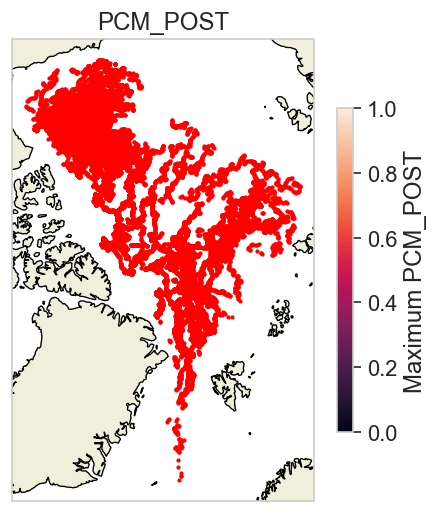

In [197]:
plot_pcm_post(ds_cleaned_750)


In [31]:
lat_step=5
lon_step=60
quantile=0.90
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=0.90))
ds_cleaned_750_spatially_sampled_1 = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
# ds_cleaned_750_spatially_sampled_1
ds_cleaned_750_monthly_sampled_1=ramdon_sample_by_month(ds_cleaned_750_spatially_sampled_1, 1, random_seed=0)
ds_cleaned_750_monthly_sampled_1['lat_step']=lat_step
ds_cleaned_750_monthly_sampled_1['lon_step']=lon_step
ds_cleaned_750_monthly_sampled_1['quantile']=quantile
ds_cleaned_750_monthly_sampled_1

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 834


<xarray.Dataset>
Dimensions:           (nprof: 10008, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp90grd0229' ... 'itp111grd0131'
    date              (nprof) datetime64[ns] 2016-01-15T00:02:04.416000 ... 2...
    lon               (nprof) float64 134.0 -156.7 -147.1 ... 118.0 138.7 119.5
    lat               (nprof) float64 82.24 73.51 73.47 ... 84.79 81.84 86.47
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 ... 10003 10004 10005 10006 10007
Data variables:
    temperature       (nprof, pressure) float64 -1.79 -1.79 ... 0.25 0.2504
    salinity          (nprof, pressure) float64 32.57 32.57 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan nan ... nan nan nan
    lat_step          int32 5
    lon_step          int32 60
    quantile          float64 0.9

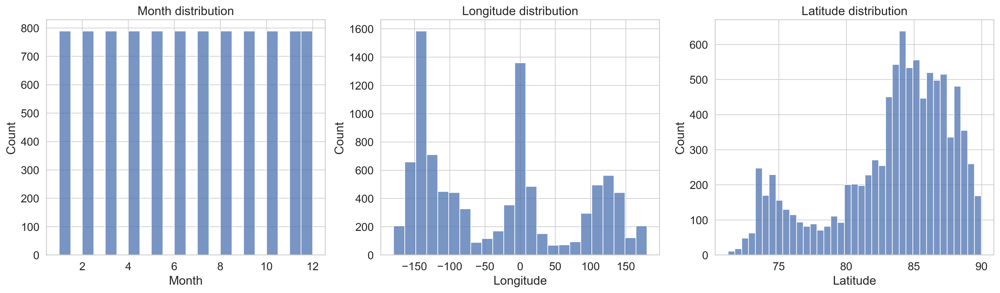

In [48]:
plot_distribution(ds_cleaned_750_monthly_sampled_1)
plot_latlon_bins(ds_cleaned_750_monthly_sampled_1, lat_step, lon_step)

In [32]:
lat_step=5
lon_step=60
quantile=0.85
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=0.85))
ds_cleaned_750_spatially_sampled_2 = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
# ds_cleaned_750_spatially_sampled_2
ds_cleaned_750_monthly_sampled_2=ramdon_sample_by_month(ds_cleaned_750_spatially_sampled_2, 1, random_seed=0)
ds_cleaned_750_monthly_sampled_2['lat_step']=lat_step
ds_cleaned_750_monthly_sampled_2['lon_step']=lon_step
ds_cleaned_750_monthly_sampled_2['quantile']=quantile
ds_cleaned_750_monthly_sampled_2


Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 436


<xarray.Dataset>
Dimensions:           (nprof: 5232, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp26grd0259' ... 'itp74grd0167'
    date              (nprof) datetime64[ns] 2009-01-19T00:00:06.912000 ... 2...
    lon               (nprof) float64 163.7 -86.7 90.81 ... -42.54 135.4 109.0
    lat               (nprof) float64 84.34 85.56 87.34 ... 87.16 81.94 82.18
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 5 ... 5227 5228 5229 5230 5231
Data variables:
    temperature       (nprof, pressure) float64 -1.667 -1.667 ... 0.1782 0.1678
    salinity          (nprof, pressure) float64 30.47 30.47 ... 34.89 34.89
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan nan ... nan nan nan
    lat_step          int32 5
    lon_step          int32 60
    quantile          float64 0.85

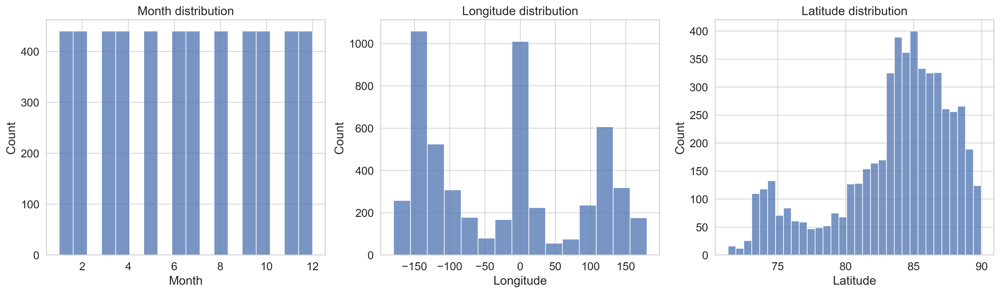

In [51]:
plot_distribution(ds_cleaned_750_monthly_sampled_2)
plot_latlon_bins(ds_cleaned_750_monthly_sampled_2, lat_step, lon_step)

In [33]:
lat_step=2
lon_step=60
quantile=0.95
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=0.95))
ds_cleaned_750_spatially_sampled_3 = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
# ds_cleaned_750_spatially_sampled_2
ds_cleaned_750_monthly_sampled_3=ramdon_sample_by_month(ds_cleaned_750_spatially_sampled_3, 1, random_seed=0)
ds_cleaned_750_monthly_sampled_3['lat_step']=lat_step
ds_cleaned_750_monthly_sampled_3['lon_step']=lon_step
ds_cleaned_750_monthly_sampled_3['quantile']=quantile
ds_cleaned_750_monthly_sampled_3

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1146


<xarray.Dataset>
Dimensions:           (nprof: 13752, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp25grd0246' ... 'itp37grd0204'
    date              (nprof) datetime64[ns] 2009-01-23T06:00:05.184000 ... 2...
    lon               (nprof) float64 -137.4 -143.9 -172.8 ... -26.91 117.2
    lat               (nprof) float64 82.55 79.17 87.39 ... 85.85 86.44 84.76
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 ... 13747 13748 13749 13750 13751
Data variables:
    temperature       (nprof, pressure) float64 -1.606 -1.609 ... 0.0237 0.01179
    salinity          (nprof, pressure) float64 29.42 29.45 29.5 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan nan ... nan nan nan
    lat_step          int32 2
    lon_step          int32 60
    quantile          float64 0.95

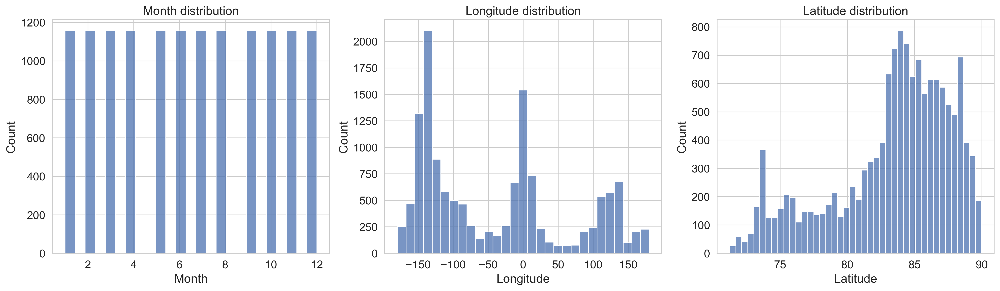

In [62]:
plot_distribution(ds_cleaned_750_monthly_sampled_3)
plot_latlon_bins(ds_cleaned_750_monthly_sampled_3, lat_step, lon_step)

In [34]:
lat_step=10
lon_step=80
quantile=0.95
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=0.95))
ds_cleaned_750_spatially_sampled_4 = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
# ds_cleaned_750_spatially_sampled_2
ds_cleaned_750_monthly_sampled_4=ramdon_sample_by_month(ds_cleaned_750_spatially_sampled_4, 1, random_seed=0)
ds_cleaned_750_monthly_sampled_4['lat_step']=lat_step
ds_cleaned_750_monthly_sampled_4['lon_step']=lon_step
ds_cleaned_750_monthly_sampled_4['quantile']=quantile
ds_cleaned_750_monthly_sampled_4

No data points for group (nan, Interval(70, 80, closed='right'))
No data points for group (nan, Interval(80, 90, closed='right'))
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 2127


<xarray.Dataset>
Dimensions:           (nprof: 25524, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp35grd0858' ... 'itp29grd0190'
    date              (nprof) datetime64[ns] 2010-01-26T20:02:50.784000 ... 2...
    lon               (nprof) float64 -136.3 -87.18 -135.9 ... -150.4 -164.7
    lat               (nprof) float64 76.05 85.51 75.43 ... 77.17 72.49 82.5
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 ... 25519 25520 25521 25522 25523
Data variables:
    temperature       (nprof, pressure) float64 -1.534 -1.534 ... 0.2448 0.2423
    salinity          (nprof, pressure) float64 28.08 28.08 ... 34.87 34.87
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan ... 298.9 298.2
    lat_step          int32 10
    lon_step          int32 80
    quantile          float64 0.95

In [35]:
lat_step=5
lon_step=70
quantile=0.95
threshold=int(cal_threshold(ds_cleaned_750, lat_step, lon_step, quantile=0.95))
ds_cleaned_750_spatially_sampled_5 = drop_profiles(ds_cleaned_750, lat_step, lon_step, threshold)
# ds_cleaned_750_spatially_sampled_2
ds_cleaned_750_monthly_sampled_5=ramdon_sample_by_month(ds_cleaned_750_spatially_sampled_5, 1, random_seed=0)
ds_cleaned_750_monthly_sampled_5['lat_step']=lat_step
ds_cleaned_750_monthly_sampled_5['lon_step']=lon_step
ds_cleaned_750_monthly_sampled_5['quantile']=quantile
ds_cleaned_750_monthly_sampled_5

No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1971


<xarray.Dataset>
Dimensions:           (nprof: 23652, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp8grd0305' ... 'itp111grd0136'
    date              (nprof) datetime64[ns] 2008-01-12T00:00:01.728000 ... 2...
    lon               (nprof) float64 -138.3 178.8 -72.38 ... -142.1 117.9
    lat               (nprof) float64 79.97 82.85 86.23 ... 83.11 73.55 86.5
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int32 0 1 2 3 4 ... 23647 23648 23649 23650 23651
Data variables:
    temperature       (nprof, pressure) float64 -1.548 -1.548 ... 0.2113 0.2049
    salinity          (nprof, pressure) float64 28.35 28.35 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 nan nan nan nan ... nan nan nan
    lat_step          int32 5
    lon_step          int32 70
    quantile          float64 0.95

In [ ]:
plot_distribution(ds_cleaned_750_monthly_sampled_4)
plot_latlon_bins(ds_cleaned_750_monthly_sampled_4, lat_step, lon_step)

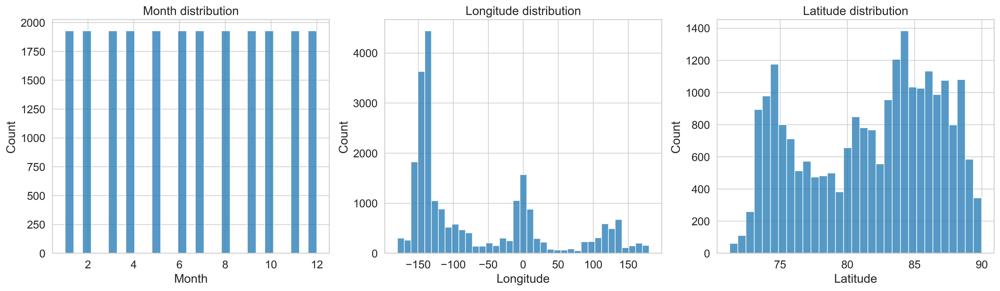

No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))


In [22]:
plot_distribution(ds_cleaned_750_monthly_sampled_5)
plot_latlon_bins(ds_cleaned_750_monthly_sampled_5, lat_step, lon_step)

In [23]:
ds_fit,m=GMM(ds_cleaned_750_monthly_sampled,ds_cleaned_750.copy(),3)
ds_fit_1,m_1=GMM(ds_cleaned_750_monthly_sampled_1,ds_cleaned_750.copy(),3)
ds_fit_2,m_2=GMM(ds_cleaned_750_monthly_sampled_2,ds_cleaned_750.copy(),3)
ds_fit_3,m_3=GMM(ds_cleaned_750_monthly_sampled_3,ds_cleaned_750.copy(),3)
ds_fit_4,m_4=GMM(ds_cleaned_750_monthly_sampled_4,ds_cleaned_750.copy(),3)
ds_fit_5,m_5=GMM(ds_cleaned_750_monthly_sampled_5,ds_cleaned_750.copy(),3)

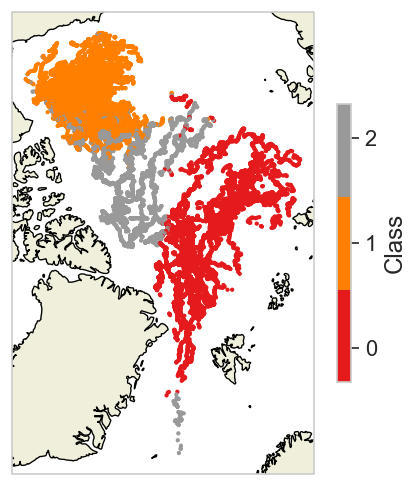

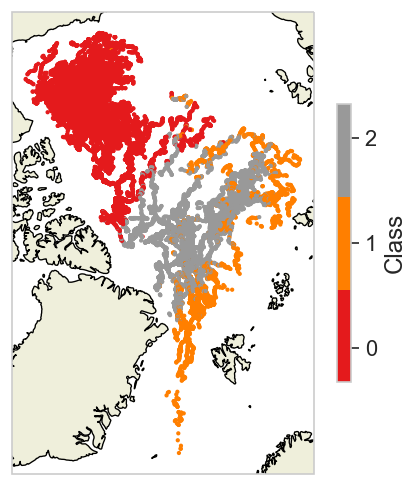

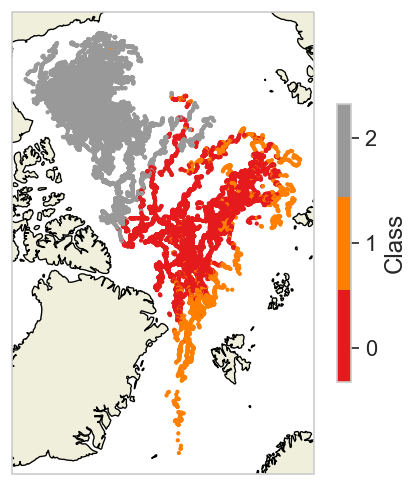

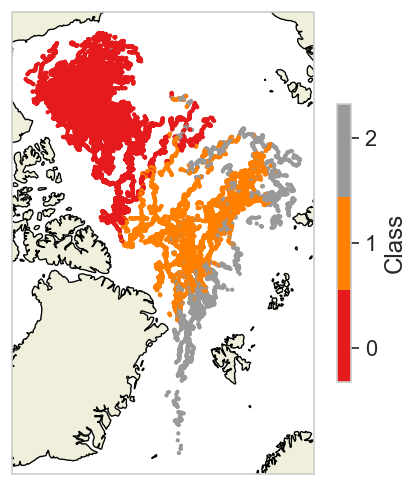

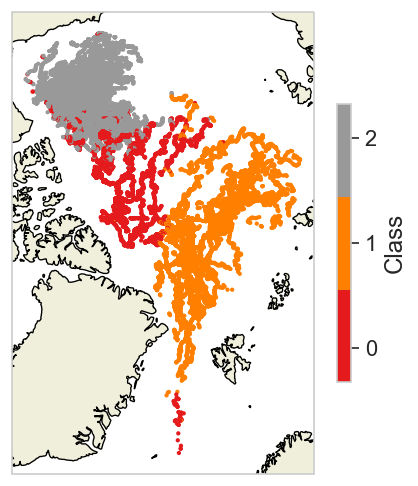

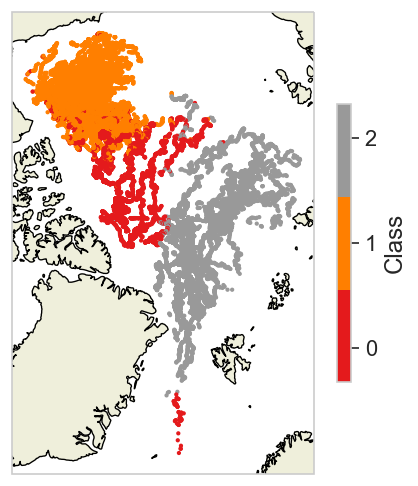

In [24]:
plot_labels(ds_fit,m)
plot_labels(ds_fit_1,m_1)
plot_labels(ds_fit_2,m_2)
plot_labels(ds_fit_3,m_3)
plot_labels(ds_fit_4,m_4)
plot_labels(ds_fit_5,m_5)

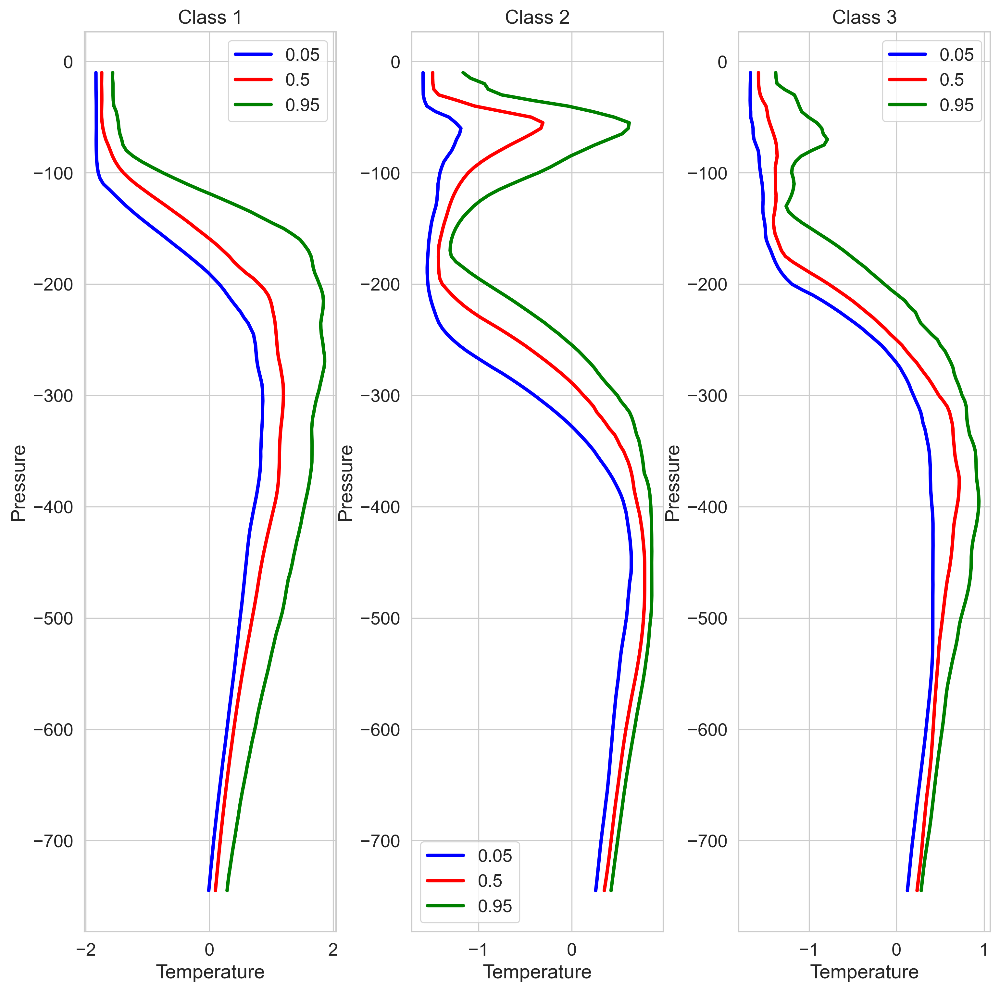

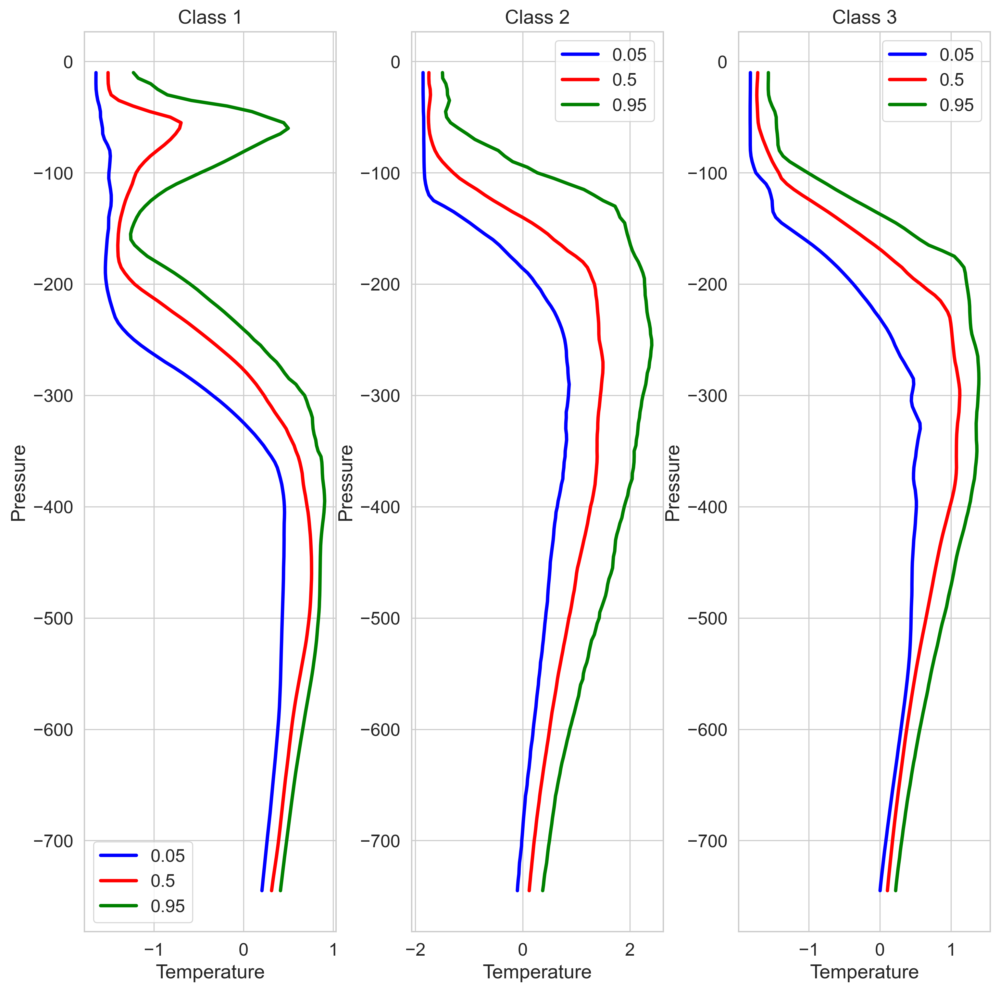

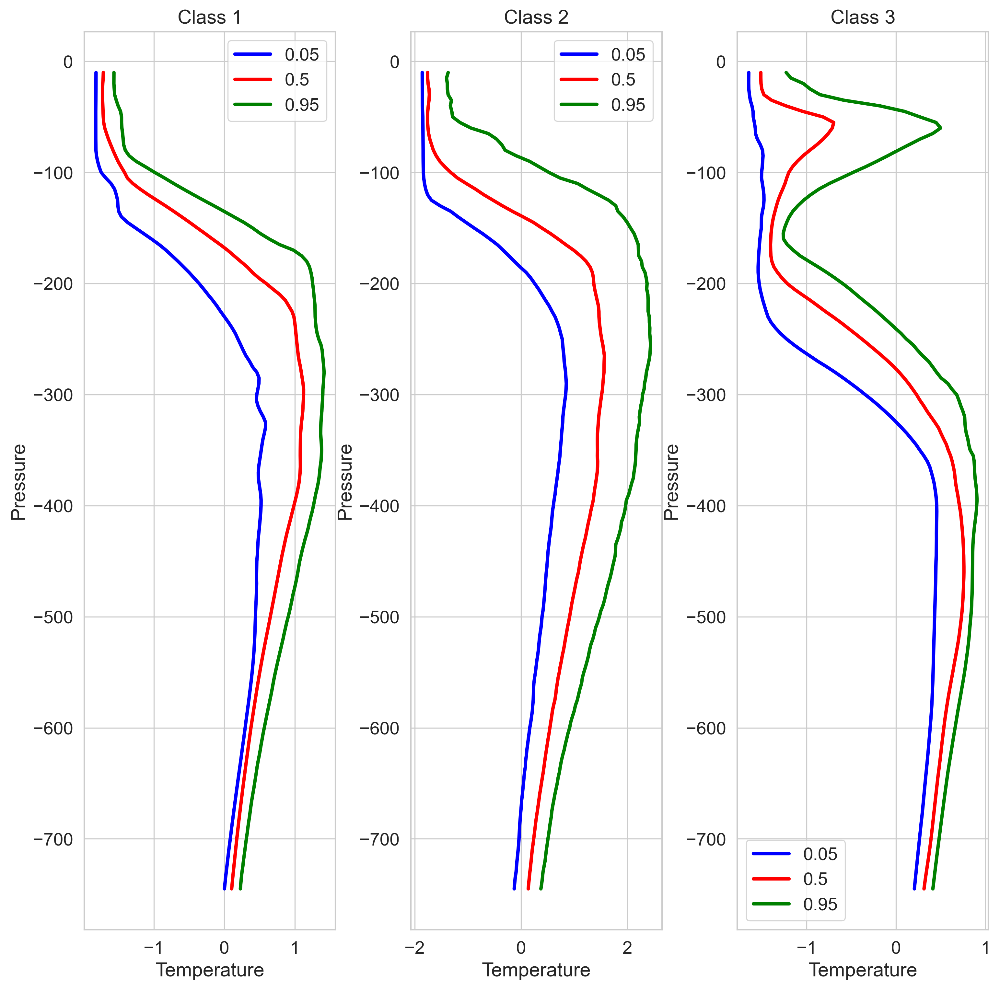

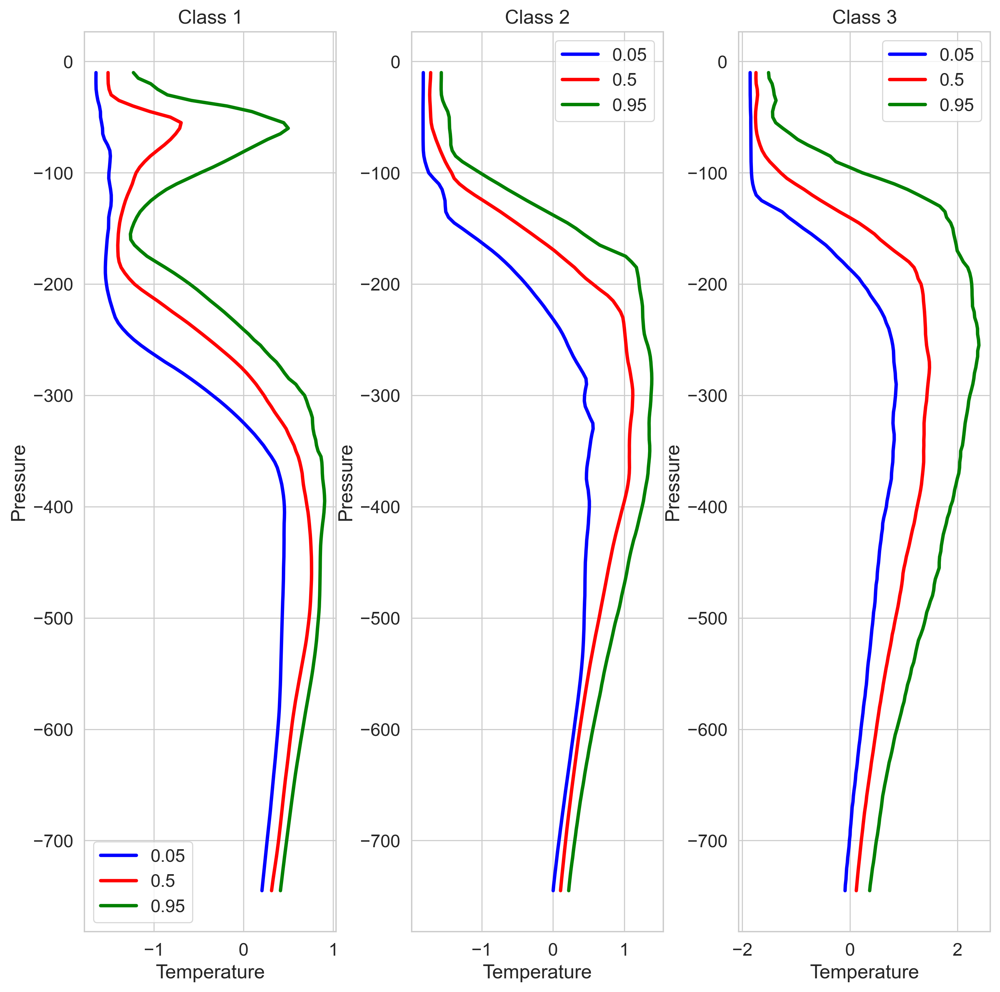

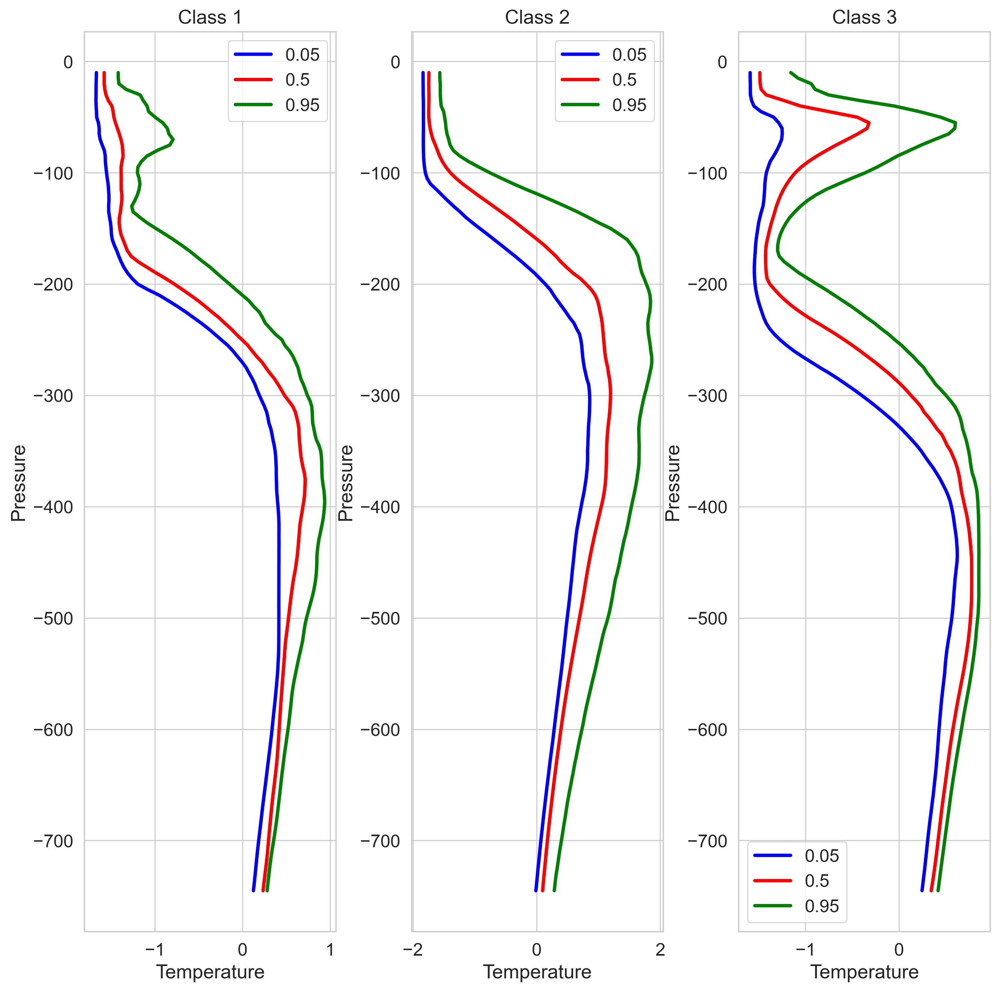

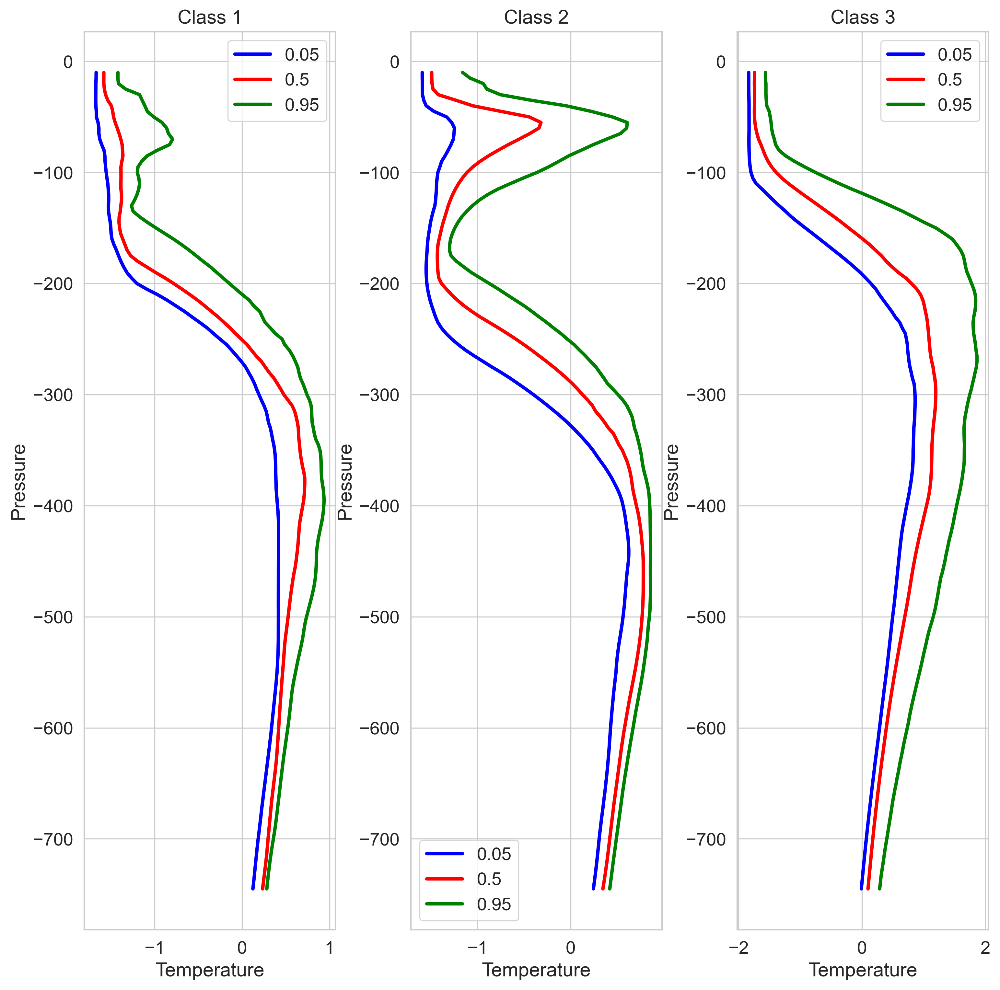

In [25]:
plot_mean_profile(ds_fit,m)
plot_mean_profile(ds_fit_1,m_1)
plot_mean_profile(ds_fit_2,m_2)
plot_mean_profile(ds_fit_3,m_3)
plot_mean_profile(ds_fit_4,m_4)
plot_mean_profile(ds_fit_5,m_5)

In [24]:
features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
m.predict_proba(ds_cleaned_750, features=features_in_ds, dim='pressure',inplace=True)
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148, pcm_class: 3)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] 2017-09-20T00:02:04.416000 ... 2...
    lon               (nprof) float64 -149.2 -148.8 -148.0 ... -97.41 -95.51
    lat               (nprof) float64 80.04 80.1 80.18 ... 82.69 82.65 82.75
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) int64 0 1 2 3 4 ... 44687 44688 44689 44690 44691
Dimensions without coordinates: pcm_class
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... 0.2263 0.2201
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 ...
    PCM_POST          (pcm_class, nprof) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0

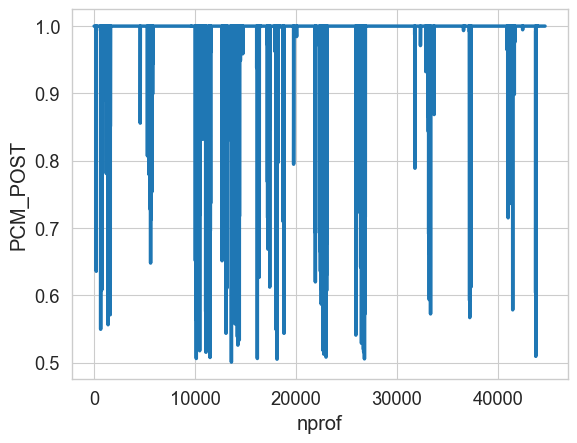

In [28]:

ds_cleaned_750.PCM_POST.max(dim='pcm_class')


In [31]:
m.predict(ds_cleaned_750, features=features_in_ds, dim='pressure',inplace=True)
bic=m.bic(ds=ds_cleaned_750,features=features_in_ds,dim='pressure')


d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning:

PCM_LABELS variable already in the dataset: overwriting



PCMFeatureError: You must specify a vertical dimension name: use argument 'dim' or specify DataSet dimension the attribute 'axis' to 'Z' (CF1.6)

In [10]:
# load ds_cleaned
import xarray as xr
ds_cleaned=xr.open_dataset(f"{data_path}/ds_cleaned.nc")

In [7]:
#randomly sample 50% of the data
import numpy as np
ds_cleaned_ran = ds_cleaned.isel(nprof=np.random.default_rng(0).choice(ds_cleaned.nprof.size, int(ds_cleaned.nprof.size*0.5), replace=False))

In [166]:
from pyxpcm.models import pcm
import numpy as np

pstart=np.max(ds_cleaned_ran['pressure'])
pend=np.min(ds_cleaned_ran['pressure'])

z = np.arange(pstart,pend,-10.)
pcm_features = {'temperature': z, 'salinity':z}

m_test = pcm(K=3, features=pcm_features)

features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
m_test.fit(ds_cleaned_ran,features=features_in_ds,dim='pressure')



<pcm 'gmm' (K: 3, F: 2)>
Number of class: 3
Number of feature: 2
Feature names: odict_keys(['temperature', 'salinity'])
Fitted: True
Feature: 'temperature'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Feature: 'salinity'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Classifier: 'gmm', <class 'sklearn.mixture._gaussian_mixture.GaussianMixture'>
	 log likelihood of the training set: 12.111657

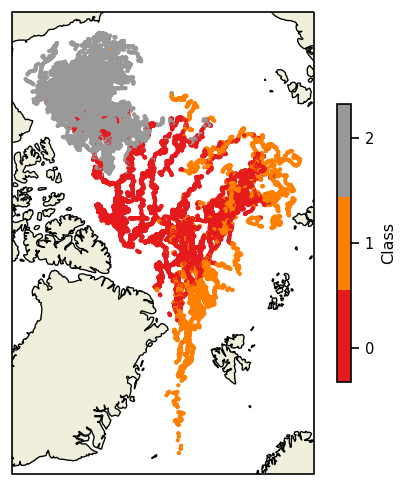

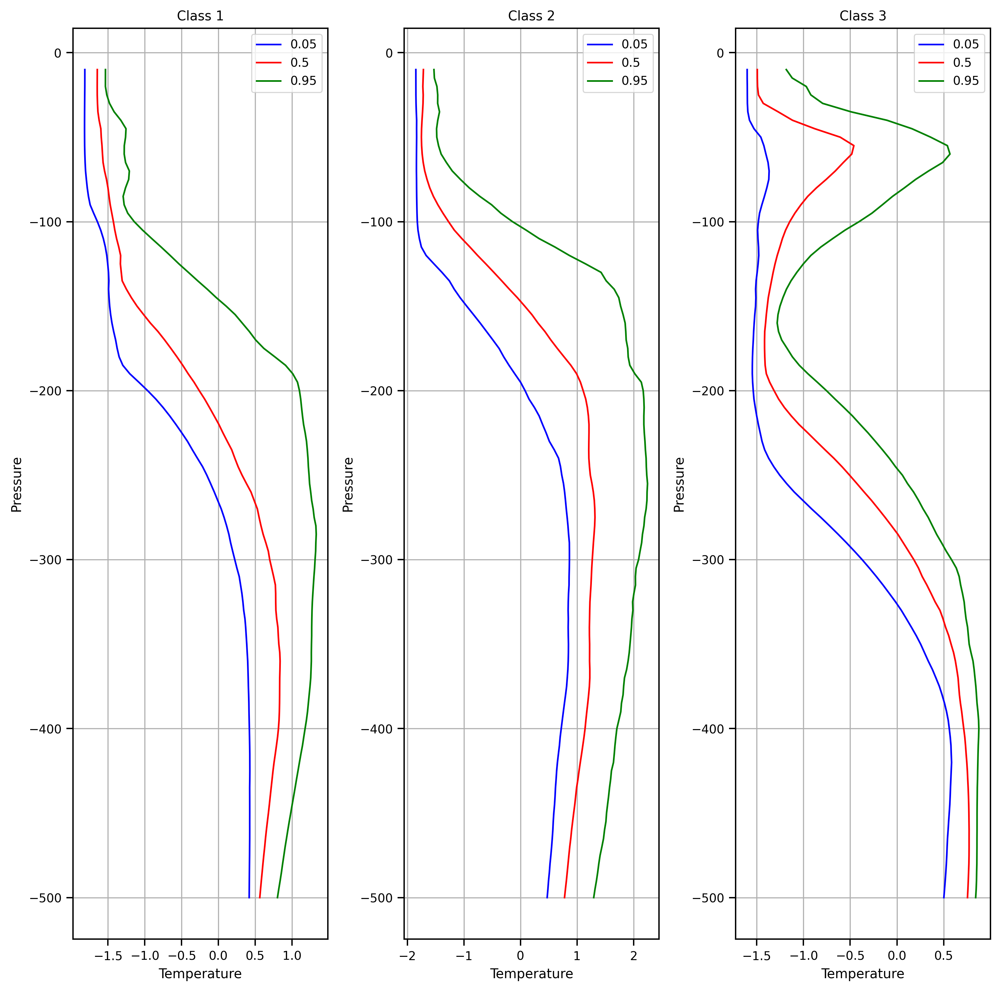

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


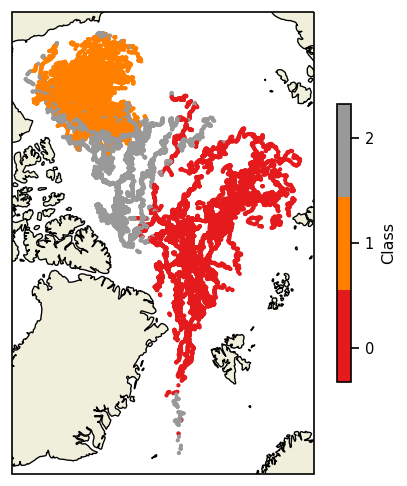

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: temperature_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))
d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: salinity_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


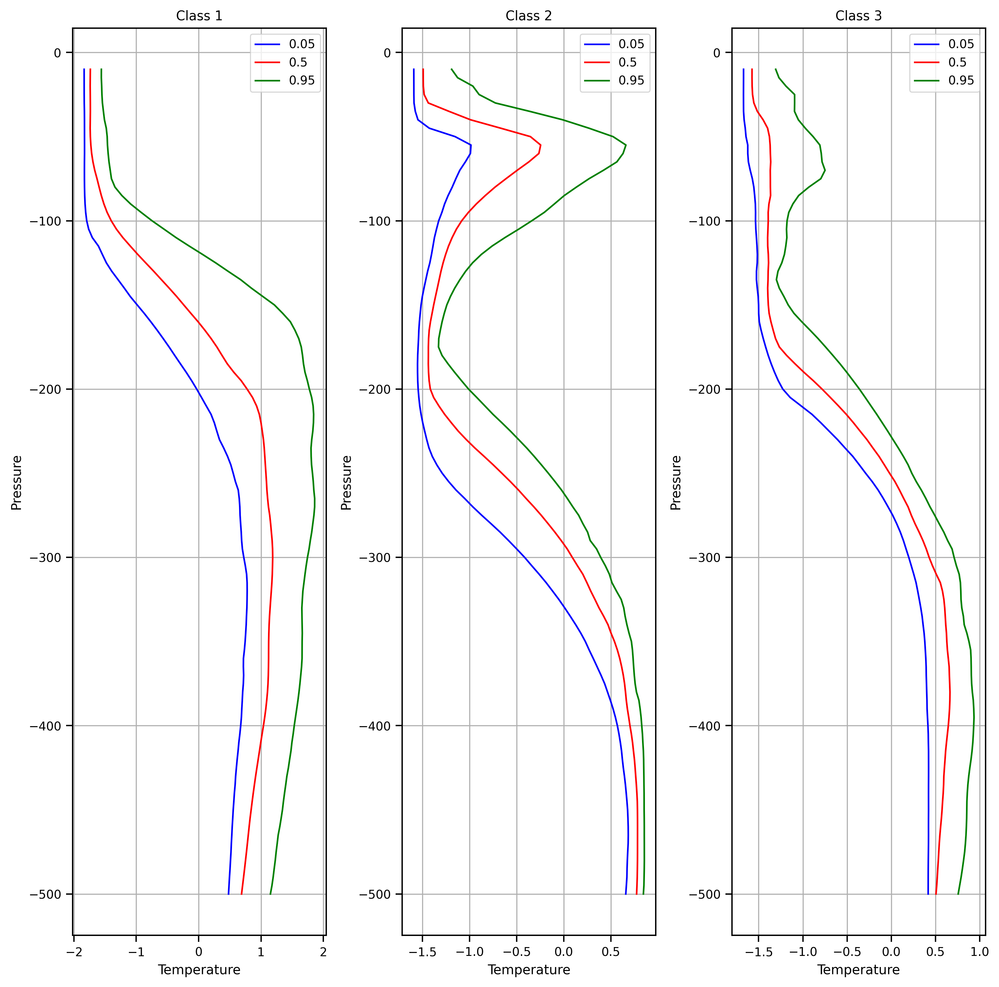

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


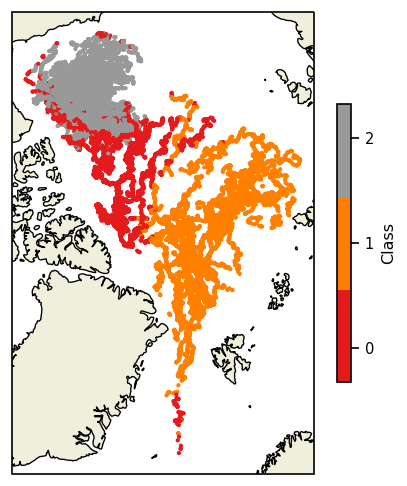

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: temperature_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))
d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: salinity_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


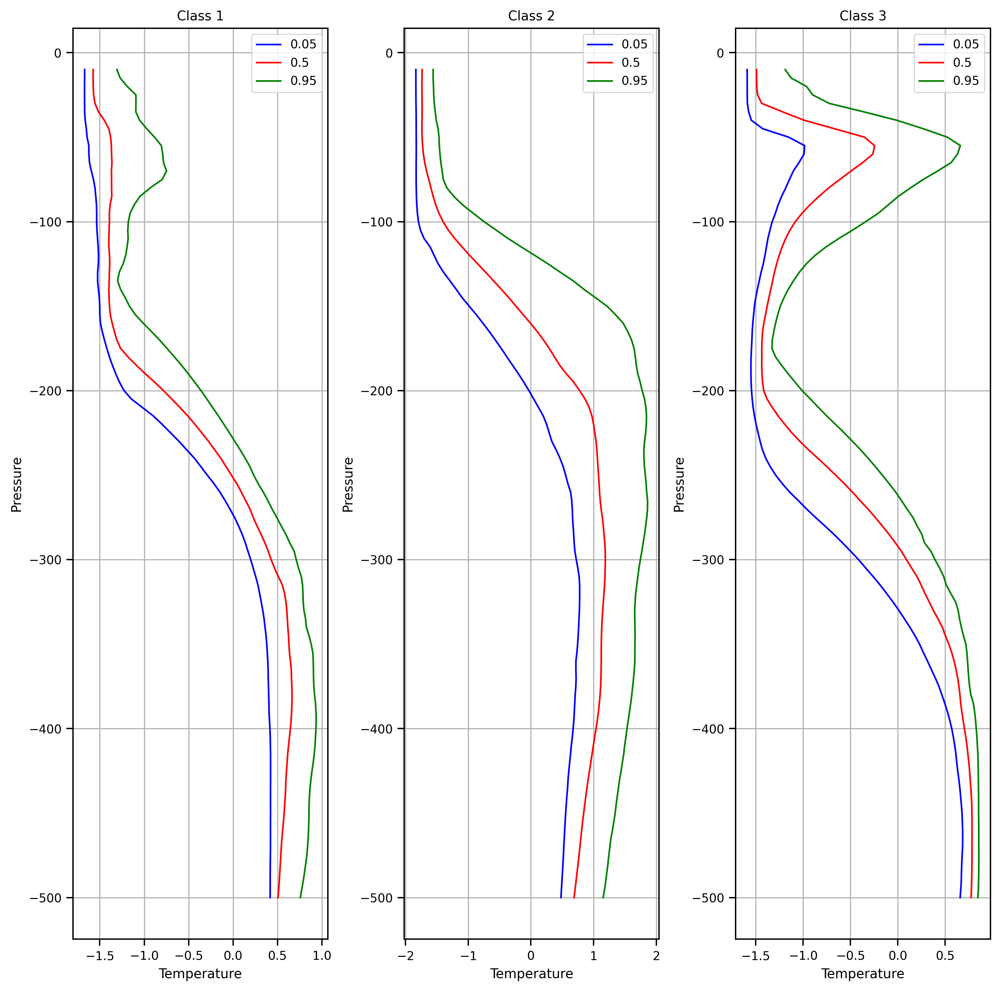

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: PCM_LABELS variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


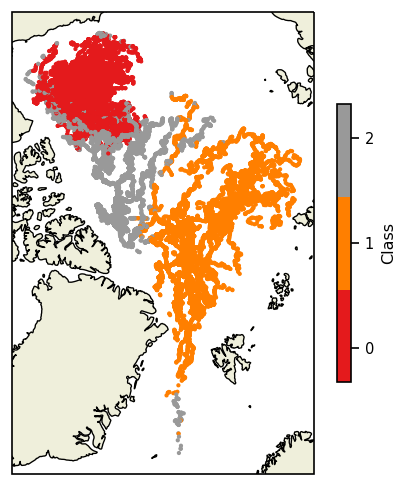

d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: temperature_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))
d:\VScode\MRes\pz_venv_w1\lib\site-packages\pyxpcm\xarray.py:89: UserWarning: salinity_Q variable already in the dataset: overwriting
  warnings.warn(("%s variable already in the dataset: overwriting") % (da.name))


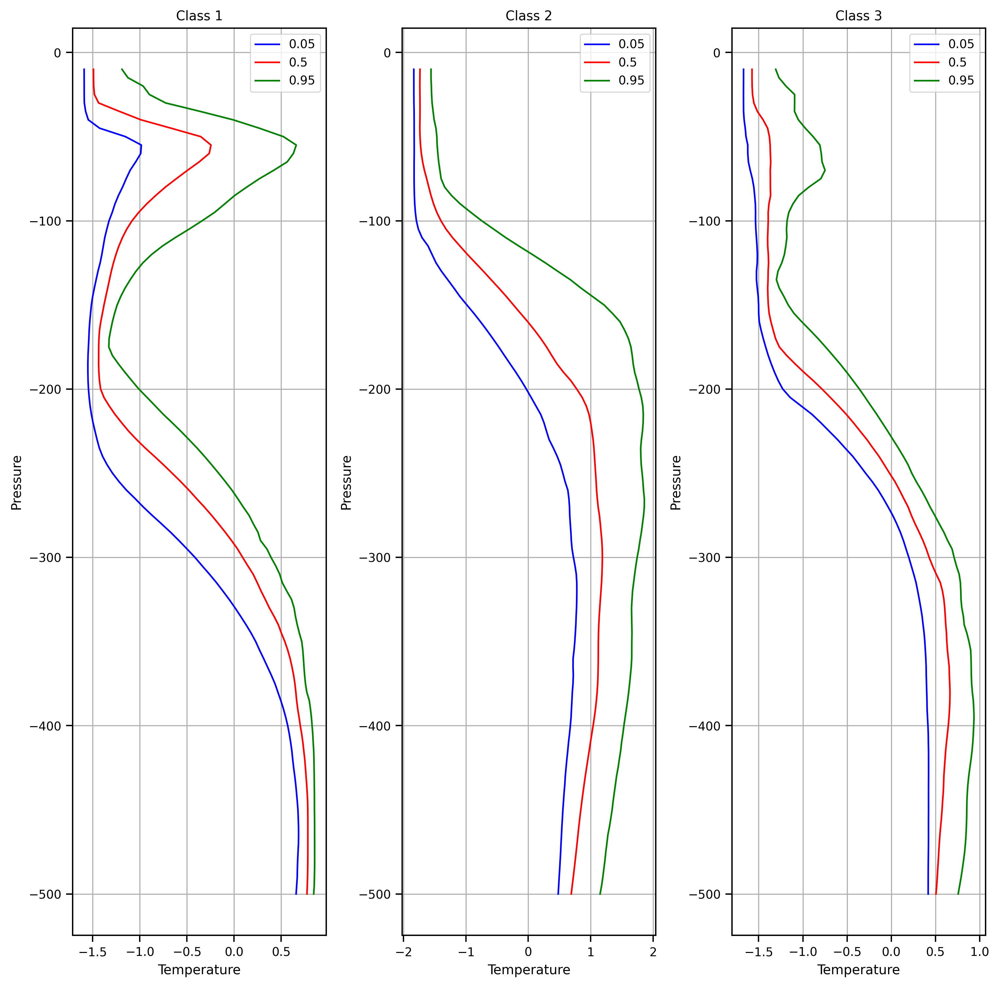

In [10]:
import plot_toolbox as tb
for i in range(4):
    #ds_cleaned=m_test.predict(ds_cleaned,features=features_in_ds,dim='pressure',inplace=True)
    ds_cleaned,m_test=GMM(ds_cleaned_ran,ds_cleaned,K=3)
    tb.plot_pred_map(ds_cleaned,m_test)
    # plot_labels(ds_test,m_test)
    plot_mean_profile(ds_cleaned,m_test)

In [32]:
from pyxpcm.models import pcm
import numpy as np

pstart=np.max(ds_cleaned_750['pressure'])
pend=np.min(ds_cleaned_750['pressure'])

z = np.arange(pstart,pend,-10.)
pcm_features = {'temperature': z, 'salinity':z}

In [33]:
m = pcm(K=3, features=pcm_features)
m

<pcm 'gmm' (K: 3, F: 2)>
Number of class: 3
Number of feature: 2
Feature names: odict_keys(['temperature', 'salinity'])
Fitted: False
Feature: 'temperature'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Feature: 'salinity'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Classifier: 'gmm', <class 'sklearn.mixture._gaussian_mixture.GaussianMixture'>

In [34]:
features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
# features_in_ds = ['temperature', 'salinity']
m.fit(ds_cleaned_750,features=features_in_ds,dim='pressure')

<pcm 'gmm' (K: 3, F: 2)>
Number of class: 3
Number of feature: 2
Feature names: odict_keys(['temperature', 'salinity'])
Fitted: True
Feature: 'temperature'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Feature: 'salinity'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Classifier: 'gmm', <class 'sklearn.mixture._gaussian_mixture.GaussianMixture'>
	 log likelihood of the training set: 12.314294

In [35]:
ds_cleaned_750=m.predict(ds_cleaned_750,features=features_in_ds,dim='pressure',inplace=True)

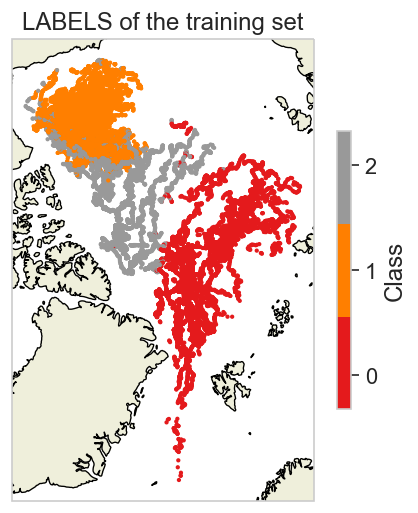

In [36]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

proj = ccrs.NorthPolarStereo()
subplot_kw={'projection': proj, 
            #'extent':([-180,180,60,90],ccrs.PlateCarree())
           }
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(5,5), dpi=120, facecolor='w', edgecolor='k', subplot_kw=subplot_kw)

kmap = m.plot.cmap()
sc = ax.scatter(ds_cleaned_750['lon'], ds_cleaned_750['lat'], s=3, c=ds_cleaned_750['PCM_LABELS'], cmap=kmap, transform=ccrs.PlateCarree(), vmin=0, vmax=m.K)
cl = m.plot.colorbar(ax=ax)

#gl = m.plot.latlongrid(ax, dx=10)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.set_title('LABELS of the training set')
plt.show()

In [26]:
ds_cleaned=xr.open_dataset(f"{data_path}/ds_cleaned.nc")
ds_cleaned

<xarray.Dataset>
Dimensions:      (nprof: 47890, pressure: 99)
Coordinates:
    profiler     (nprof) int32 ...
    date         (nprof) datetime64[ns] ...
    lon          (nprof) float64 ...
    lat          (nprof) float64 ...
  * pressure     (pressure) float64 -10.0 -15.0 -20.0 ... -490.0 -495.0 -500.0
Dimensions without coordinates: nprof
Data variables:
    temperature  (nprof, pressure) float64 ...
    salinity     (nprof, pressure) float64 ...

In [27]:
ds_cleaned_750=xr.open_dataset(f"{data_path}/ds_cleaned_750.nc")
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) object ...
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [31]:
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
  * nprof             (nprof) <U21 '0' '1' '2' '3' ... '44689' '44690' '44691'
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [55]:
import pandas as pd
import numpy as np

# Convert the 'lat' and 'lon' variables into a pandas dataframe
df_latlon = ds_cleaned_750[['lat', 'lon']].to_dataframe()

lat_step = 10.0
lon_step = 20.0

lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,185, lon_step))
lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,95, lat_step))

latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

g_len=[]
for group_key in latlon_groups.groups:
    try:
        group = latlon_groups.get_group(group_key)
        print(f"Group {group_key}: {len(group)} rows")
        g_len.append(len(group))
    except KeyError:
        # Handle the KeyError gracefully
        print(f"No data points for group {group_key}")


# print(np.min(g_len))
# #print the number of groups
# print(len(g_len))


g_len_sorted = sorted(g_len)
# print(g_len_sorted[23])

import plotly.graph_objs as go

# Create a trace for the plot
trace = go.Scatter(
    x = list(range(len(g_len_sorted))),
    y = g_len_sorted
)

# Create the layout for the plot
layout = go.Layout(
    xaxis=dict(title='Bin No.'),
    yaxis=dict(title='Number of profiles')
)

# Create the figure object and plot it
fig = go.Figure(data=[trace], layout=layout)
fig.show()


Group (Interval(-180.0, -160.0, closed='right'), Interval(70.0, 80.0, closed='right')): 244 rows
Group (Interval(-180.0, -160.0, closed='right'), Interval(80.0, 90.0, closed='right')): 746 rows
Group (Interval(-160.0, -140.0, closed='right'), Interval(70.0, 80.0, closed='right')): 12107 rows
Group (Interval(-160.0, -140.0, closed='right'), Interval(80.0, 90.0, closed='right')): 2339 rows
Group (Interval(-140.0, -120.0, closed='right'), Interval(70.0, 80.0, closed='right')): 10920 rows
Group (Interval(-140.0, -120.0, closed='right'), Interval(80.0, 90.0, closed='right')): 2568 rows
Group (Interval(-120.0, -100.0, closed='right'), Interval(80.0, 90.0, closed='right')): 1859 rows
Group (Interval(-100.0, -80.0, closed='right'), Interval(80.0, 90.0, closed='right')): 1564 rows
Group (Interval(-80.0, -60.0, closed='right'), Interval(80.0, 90.0, closed='right')): 594 rows
Group (Interval(-60.0, -40.0, closed='right'), Interval(80.0, 90.0, closed='right')): 498 rows
Group (Interval(-40.0, -20.

In [10]:
df_latlon

,lat,lon,profiler,date
nprof,,,,
0,80.0378,-149.1544,itp100grd0001,2017-09-20 00:02:04.416000
1,80.0992,-148.7704,itp100grd0003,2017-09-21 00:02:02.688000
2,80.1768,-147.9601,itp100grd0005,2017-09-22 00:02:02.688000
3,80.2801,-145.6491,itp100grd0009,2017-09-24 00:02:02.688000
4,80.3072,-145.0618,itp100grd0011,2017-09-25 00:02:02.688000
...,...,...,...,...
44687,82.7761,-97.1397,itp9grd1009,2008-12-04 00:24:16.704000
44688,82.7275,-97.1654,itp9grd1012,2008-12-04 12:00:05.183999
44689,82.6869,-97.2736,itp9grd1013,2008-12-05 00:24:14.976000


In [5]:
min_bin_sample_size=np.min(g_len)
min_bin_sample_size

26

10920


In [19]:
df_latlon_sampled

NameError: name 'df_latlon_sampled' is not defined

In [54]:
# loop through the latlon_groups and get the groups with sample size larger than the threshold=2591
threshold = 2591


# Create a list to store the groups with sample size larger than the threshold
latlon_groups_list = []

# Loop through the groups
for group_key in latlon_groups.groups:
    try:
        group = latlon_groups.get_group(group_key)
        if len(group) > threshold:
            # latlon_groups_list.append(group_key)
            print(f"Group {group_key}: {len(group)} rows")
            # randomly select n=threshold samples from the group and get the nprof of it
            group_drop = group.sample(n=len(group)-threshold)
            print(f"Dropped data: Group {group_key}: {len(group_drop)} rows")
            # replace the group with the group_sample
            latlon_groups_list.append(group_drop)
    except KeyError:
        # Handle the KeyError gracefully
        print(f"No data points for group {group_key}")

# create a new xarray that contains the data with sample size smaller than the threshold
ds_cleaned_750_spatially_sampled = ds_cleaned_750.copy()

# loop through the latlon_groups_list and create a list to store the nprof of the dropped data
nprof_dropped = []

for group in latlon_groups_list:
    # get the nprof of the dropped data
    temp_index=group.index.values
    print(temp_index)
    nprof_dropped.append(temp_index.tolist())
# reshape the list to 1D
nprof_dropped = [item for sublist in nprof_dropped for item in sublist]
# print the nprof_dropped
print (nprof_dropped)
# drop the data 
ds_cleaned_750_spatially_sampled = ds_cleaned_750_spatially_sampled.drop_sel(nprof=nprof_dropped)

ds_cleaned_750_spatially_sampled

Group (Interval(-160.0, -140.0, closed='right'), Interval(70.0, 80.0, closed='right')): 12107 rows
Dropped data: Group (Interval(-160.0, -140.0, closed='right'), Interval(70.0, 80.0, closed='right')): 9516 rows
Group (Interval(-140.0, -120.0, closed='right'), Interval(70.0, 80.0, closed='right')): 10920 rows
Dropped data: Group (Interval(-140.0, -120.0, closed='right'), Interval(70.0, 80.0, closed='right')): 8329 rows
[21934 33813  3632 ... 32563 39292 27184]
[31936 11552 33386 ...  2659 41302  5396]
[21934, 33813, 3632, 39739, 20372, 26732, 34010, 8150, 36465, 6434, 23876, 40688, 39645, 38888, 6709, 30224, 27520, 39259, 40865, 33829, 23347, 6624, 31806, 43315, 31959, 35612, 13320, 27461, 13413, 33953, 11765, 30230, 30405, 3364, 40072, 40512, 19313, 1898, 6548, 19455, 36329, 6689, 23353, 12667, 36962, 36321, 38868, 38802, 40652, 30052, 34041, 6487, 1703, 27651, 6781, 33456, 23652, 30500, 41732, 11767, 3341, 1962, 33998, 33307, 40135, 27638, 19913, 6915, 32579, 40802, 32962, 24514, 3283

<xarray.Dataset>
Dimensions:           (nprof: 26847, pressure: 148)
Coordinates:
    profiler          (nprof) object 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] 2017-09-20T00:02:04.416000 ... 2...
    lon               (nprof) float64 -149.2 -148.8 -148.0 ... -97.41 -95.51
    lat               (nprof) float64 80.04 80.1 80.18 ... 82.69 82.65 82.75
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [22]:
latlon_groups_list[0]

,lat,lon,profiler,date
nprof,,,,
40848,75.9657,-151.0846,itp89grd0401,2016-04-22 00:02:04.416000
6508,75.0030,-148.1163,itp120grd0628,2021-02-27 18:02:07.872000
40154,78.1087,-141.0512,itp87grd0308,2015-01-30 06:02:01.824000
12859,78.7547,-141.8952,itp1grd0221,2005-10-11 06:00:02.591999
19416,75.2948,-152.2984,itp33grd0445,2010-05-18 00:00:06.047999
...,...,...,...,...
6906,76.8055,-144.4767,itp120grd1061,2021-06-16 00:02:09.600000
12918,79.1835,-142.2409,itp1grd0295,2005-10-29 18:00:02.592000
33980,75.2906,-152.9640,itp70grd2691,2014-04-18 00:02:01.824000


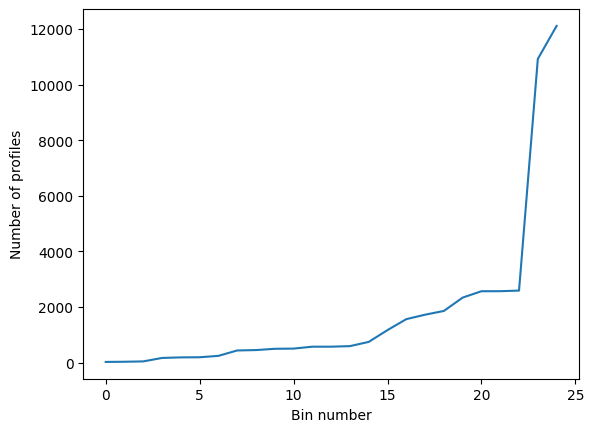

In [7]:
# plot the g_len_sorted
import matplotlib.pyplot as plt
plt.plot(g_len_sorted)
# add labels
plt.xlabel('Bin number')
plt.ylabel('Number of profiles')
plt.show()

In [18]:
print(np.mean(g_len))

313.0065359477124


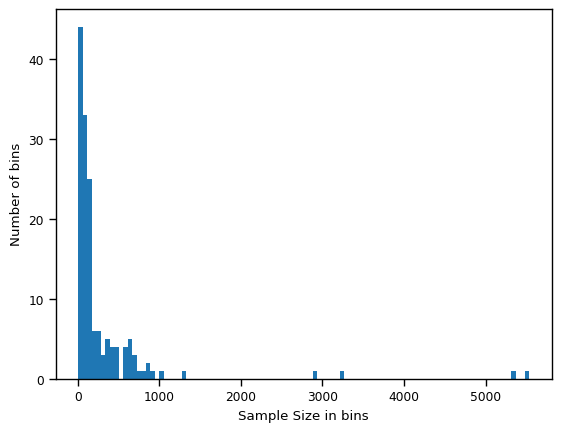

In [35]:
import matplotlib.pyplot as plt

plt.hist(g_len, bins=100)

# Add axis labels and a title
plt.xlabel("Sample Size in bins")
plt.ylabel("Number of bins")

# Show the plot
plt.show()


In [6]:
import pandas as pd

# Convert the 'lat' and 'lon' variables into a pandas dataframe
df_latlon = ds_cleaned[['lat', 'lon']].to_dataframe()

lat_size = 5.0
lon_size =5.0

lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,180, lon_size))
lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,90, lat_size))

latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

for group_key in latlon_groups.groups:
    group = latlon_groups.get_group(group_key)
    print(f"Group {group_key}: {len(group)} rows")


Group (Interval(-180.0, -175.0, closed='right'), Interval(75.0, 80.0, closed='right')): 58 rows
Group (Interval(-180.0, -175.0, closed='right'), Interval(80.0, 85.0, closed='right')): 99 rows


KeyError: (Interval(-180.0, -175.0, closed='right'), nan)

In [50]:
latlon_groups.groups

{((-180.0, -175.0], (75.0, 80.0]): [9851, 9852, 9853, 9854, 9855, 9856, 9857, 9858, 9859, 9860, 9861, 9862, 9863, 9864, 9865, 9866, 9867, 9868, 9869, 9870, 9871, 9872, 9873, 9874, 9875, 9876, 9877, 9878, 9879, 9880, 9881, 9882, 9883, 9884, 9885, 9886, 9887, 9888, 9889, 9890, 9891, 9892, 9893, 9894, 9895, 9896, 9897, 9898, 9899, 9905, 9906, 9907, 9908, 9911, 9912, 9913, 9914, 9915], ((-180.0, -175.0], (80.0, 85.0]): [17593, 17594, 17595, 17596, 17597, 17598, 17599, 17600, 17601, 17602, 17603, 17604, 17605, 17606, 17607, 17608, 17609, 17610, 17611, 17612, 17613, 17614, 17615, 17616, 17617, 17618, 17619, 17620, 17621, 17622, 17623, 17624, 17625, 17626, 17627, 17628, 17629, 17630, 17631, 17632, 17633, 17634, 17635, 17636, 17637, 17638, 17639, 17651, 17828, 17829, 17830, 17831, 17832, 17833, 17834, 17835, 17836, 17837, 17838, 17839, 17840, 17841, 17842, 17843, 17844, 17845, 17846, 17847, 17848, 45589, 45590, 45591, 45592, 45593, 45594, 45595, 45596, 45597, 45598, 45599, 45600, 45601, 45602,

In [29]:
import pandas as pd

# Convert the 'lat' and 'lon' variables into a pandas dataframe
df_latlon = ds_cleaned[['lat', 'lon']].to_dataframe()

lat_size = 5.0
lon_size =5.0

lon_bins = pd.cut(df_latlon['lon'], bins=np.arange(-180,180, lon_size))
lat_bins = pd.cut(df_latlon['lat'], bins=np.arange(-90,90, lat_size))

latlon_groups = df_latlon.groupby([lon_bins, lat_bins])

group = latlon_groups.get_group((pd.Interval(-180, -175,closed='right'), pd.Interval(75, 80,closed='right')))
len(group.index)


In [35]:
df_latlon

,lat,lon,profiler,date
nprof,,,,
0,80.0378,-149.1544,100,2017-09-20 00:02:04.416000
1,80.0992,-148.7704,100,2017-09-21 00:02:02.688000
2,80.1768,-147.9601,100,2017-09-22 00:02:02.688000
3,80.2801,-145.6491,100,2017-09-24 00:02:02.688000
4,80.3072,-145.0618,100,2017-09-25 00:02:02.688000
...,...,...,...,...
47885,82.6869,-97.2736,9,2008-12-05 00:24:14.976000
47886,82.6647,-97.3694,9,2008-12-05 07:12:00.864000
47887,82.6484,-97.4092,9,2008-12-05 12:00:05.183999


In [31]:

unique_groups = latlon_groups.groups.keys()
print(unique_groups)


dict_keys([(Interval(-180.0, -175.0, closed='right'), Interval(75.0, 80.0, closed='right')), (Interval(-180.0, -175.0, closed='right'), Interval(80.0, 85.0, closed='right')), (Interval(-180.0, -175.0, closed='right'), nan), (Interval(-175.0, -170.0, closed='right'), Interval(75.0, 80.0, closed='right')), (Interval(-175.0, -170.0, closed='right'), Interval(80.0, 85.0, closed='right')), (Interval(-175.0, -170.0, closed='right'), nan), (Interval(-170.0, -165.0, closed='right'), Interval(80.0, 85.0, closed='right')), (Interval(-170.0, -165.0, closed='right'), nan), (Interval(-165.0, -160.0, closed='right'), Interval(70.0, 75.0, closed='right')), (Interval(-165.0, -160.0, closed='right'), Interval(75.0, 80.0, closed='right')), (Interval(-165.0, -160.0, closed='right'), Interval(80.0, 85.0, closed='right')), (Interval(-165.0, -160.0, closed='right'), nan), (Interval(-160.0, -155.0, closed='right'), Interval(70.0, 75.0, closed='right')), (Interval(-160.0, -155.0, closed='right'), Interval(75.

In [33]:
group = latlon_groups.get_group((pd.Interval(-180, -175,closed='right'), pd.Interval(75, 80,closed='right')))



In [46]:
group.index.values


array([9851, 9852, 9853, 9854, 9855, 9856, 9857, 9858, 9859, 9860, 9861,
       9862, 9863, 9864, 9865, 9866, 9867, 9868, 9869, 9870, 9871, 9872,
       9873, 9874, 9875, 9876, 9877, 9878, 9879, 9880, 9881, 9882, 9883,
       9884, 9885, 9886, 9887, 9888, 9889, 9890, 9891, 9892, 9893, 9894,
       9895, 9896, 9897, 9898, 9899, 9905, 9906, 9907, 9908, 9911, 9912,
       9913, 9914, 9915], dtype=int64)

In [48]:
len(group.index)

58

In [52]:
# Patitioning the data into training and testing dataset
def data_partioning(ds_cleaned, ratio=0.8):
    size=int(ds_cleaned.nprof.size*ratio)
    indices = np.random.choice(ds_cleaned.nprof, size=size, replace=False)
    ds_train = ds_cleaned.isel(nprof=indices)

    indices = np.setdiff1d(ds_cleaned.nprof, ds_train.nprof)
    ds_test = ds_cleaned.isel(nprof=indices)

    return ds_train, ds_test
# ratio=0.8 # The ratio of training dataset

# size=int(ds_cleaned.nprof.size*ratio)
# indices = np.random.choice(ds_cleaned.nprof, size=size, replace=False)
# ds_train = ds_cleaned.isel(nprof=indices)

# indices = np.setdiff1d(ds_cleaned.nprof, ds_train.nprof)
# ds_test = ds_cleaned.isel(nprof=indices)

In [ ]:
pstart=np.max(ds_train.pressure)
pend=np.min(ds_train.pressure)
z = np.arange(pstart,pend,-10.)
pcm_features = {'temperature': z, 'salinity':z}
m = pcm(K=3, features=pcm_features,maxvar=3)
features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
m.fit(ds_train,features=features_in_ds,dim='pressure')

In [17]:
ds_train

<xarray.Dataset>
Dimensions:      (nprof: 38312, pressure: 99)
Coordinates:
    profiler     (nprof) int32 ...
    date         (nprof) datetime64[ns] ...
    lon          (nprof) float64 ...
    lat          (nprof) float64 ...
  * pressure     (pressure) float64 -10.0 -15.0 -20.0 ... -490.0 -495.0 -500.0
Dimensions without coordinates: nprof
Data variables:
    temperature  (nprof, pressure) float64 ...
    salinity     (nprof, pressure) float64 ...

In [18]:
ds_test

<xarray.Dataset>
Dimensions:      (nprof: 9578, pressure: 99)
Coordinates:
    profiler     (nprof) int32 ...
    date         (nprof) datetime64[ns] ...
    lon          (nprof) float64 ...
    lat          (nprof) float64 ...
  * pressure     (pressure) float64 -10.0 -15.0 -20.0 ... -490.0 -495.0 -500.0
Dimensions without coordinates: nprof
Data variables:
    temperature  (nprof, pressure) float64 ...
    salinity     (nprof, pressure) float64 ...

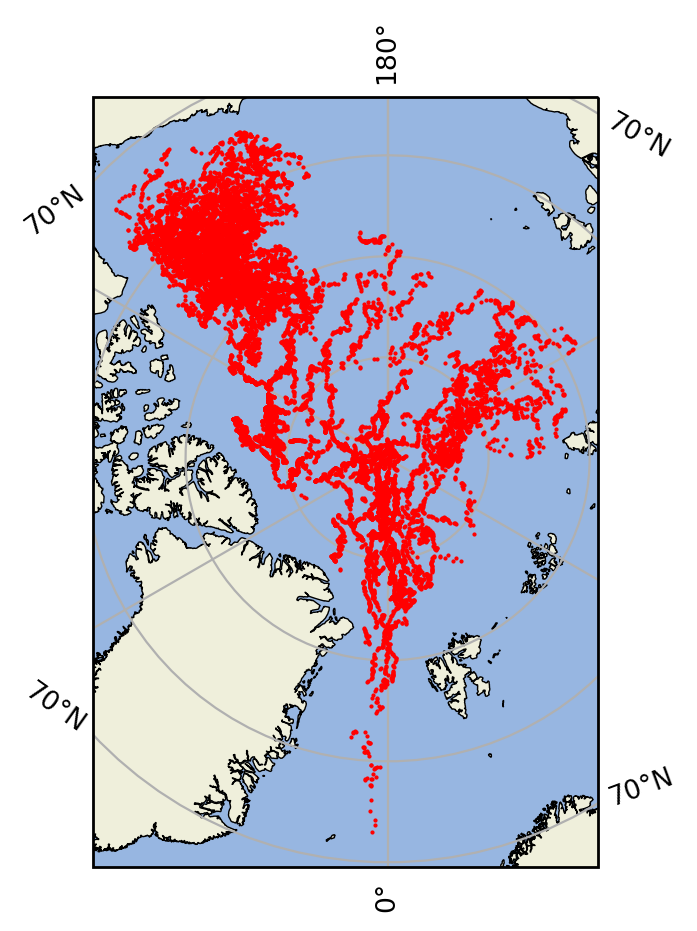

In [9]:
tb.plot_data_location(ds_train)

In [19]:
pstart=np.max(ds_train.pressure)
pend=np.min(ds_train.pressure)
z = np.arange(pstart,pend,-10.)
pcm_features = {'temperature': z, 'salinity':z}
m = pcm(K=3, features=pcm_features,maxvar=3)
m

<pcm 'gmm' (K: 3, F: 2)>
Number of class: 3
Number of feature: 2
Feature names: odict_keys(['temperature', 'salinity'])
Fitted: False
Feature: 'temperature'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Feature: 'salinity'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Classifier: 'gmm', <class 'sklearn.mixture._gaussian_mixture.GaussianMixture'>

In [20]:
features_in_ds = {'temperature': 'temperature', 'salinity': 'salinity'}
m.fit(ds_train,features=features_in_ds,dim='pressure')

<pcm 'gmm' (K: 3, F: 2)>
Number of class: 3
Number of feature: 2
Feature names: odict_keys(['temperature', 'salinity'])
Fitted: True
Feature: 'temperature'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Feature: 'salinity'
	 Interpoler: <class 'pyxpcm.utils.Vertical_Interpolator'>
	 Scaler: 'normal', <class 'sklearn.preprocessing._data.StandardScaler'>
	 Reducer: True, <class 'sklearn.decomposition._pca.PCA'>
Classifier: 'gmm', <class 'sklearn.mixture._gaussian_mixture.GaussianMixture'>
	 log likelihood of the training set: -1.176652

In [21]:
ds_test=m.predict(ds_test,features=features_in_ds,dim='pressure',inplace=True)

<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast


In [22]:
ds_test

<xarray.Dataset>
Dimensions:      (nprof: 9578, pressure: 99)
Coordinates:
    profiler     (nprof) int32 78 78 78 78 78 78 78 78 78 ... 9 9 9 9 9 9 9 9 9
    date         (nprof) datetime64[ns] 2014-04-09T21:02:06.144000 ... 2009-0...
    lon          (nprof) float64 -137.1 -137.2 -137.3 ... -97.41 -95.51 -95.29
    lat          (nprof) float64 74.29 74.29 74.35 74.35 ... 82.65 82.75 82.76
  * pressure     (pressure) float64 -10.0 -15.0 -20.0 ... -490.0 -495.0 -500.0
  * nprof        (nprof) int64 0 1 2 3 4 5 6 ... 9572 9573 9574 9575 9576 9577
Data variables:
    temperature  (nprof, pressure) float64 -1.567 -1.566 -1.566 ... 0.422 0.4203
    salinity     (nprof, pressure) float64 28.88 28.88 28.88 ... 34.84 34.84
    PCM_LABELS   (nprof) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1 1 1

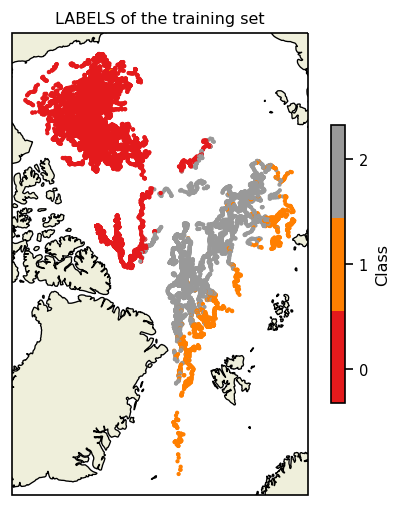

In [14]:
tb.plot_pred_map(ds_test,m)

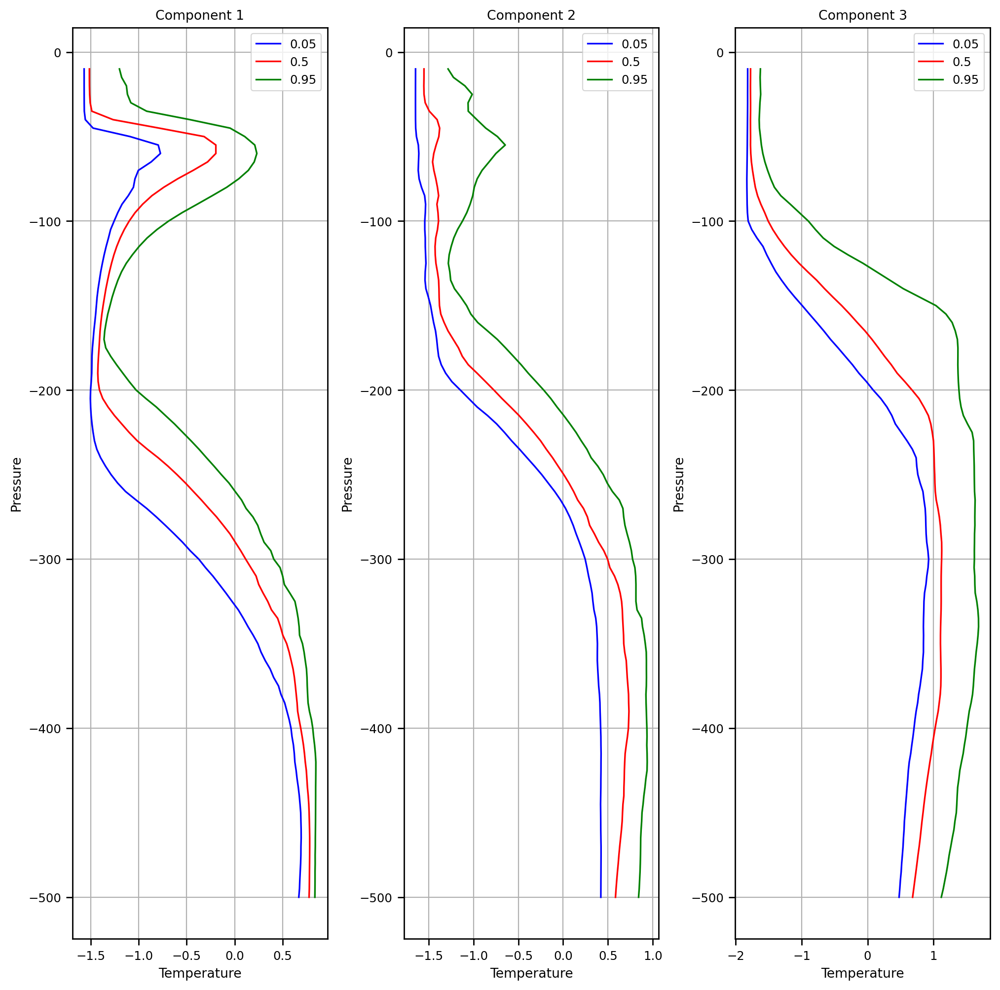

In [23]:
# Calculate the quantile and plot it
for vname in ['temperature', 'salinity']:
    ds_test = ds_test.pyxpcm.quantile(m, q=[0.05, 0.5, 0.95], of=vname, outname=vname + '_Q', keep_attrs=True, inplace=True)    

ds_group = ds_test.groupby('PCM_LABELS')
tb.plot_quantile(ds_group)